### Project Description

**Every year a lot of companies hire a number of employees. The companies invest time and money in training those employees, not just this but there are training programs within the companies for their existing employees as well. The aim of these programs is to increase the effectiveness of their employees. But where HR Analytics fit in this? and is it just about improving the performance of employees?**

#### HR Analytics
Human resource analytics (HR analytics) is an area in the field of analytics that refers to applying analytic processes to the human resource department of an organization in the hope of improving employee performance and therefore getting a better return on investment. HR analytics does not just deal with gathering data on employee efficiency. Instead, it aims to provide insight into each process by gathering data and then using it to make relevant decisions about how to improve these processes.

#### Attrition in HR
Attrition in human resources refers to the gradual loss of employees overtime. In general, relatively high attrition is problematic for companies. HR professionals often assume a leadership role in designing company compensation programs, work culture, and motivation systems that help the organization retain top employees.
How does Attrition affect companies? and how does HR Analytics help in analyzing attrition? We will discuss the first question here and for the second question, we will write the code and try to understand the process step by step.

#### Attrition affecting Companies
A major problem in high employee attrition is its cost to an organization. Job postings, hiring processes, paperwork, and new hire training are some of the common expenses of losing employees and replacing them. Additionally, regular employee turnover prohibits your organization from increasing its collective knowledge base and experience over time. This is especially concerning if your business is customer-facing, as customers often prefer to interact with familiar people. Errors and issues are more likely if you constantly have new workers.


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
%matplotlib inline
import seaborn as sns
from scipy.stats import zscore
from sklearn.linear_model import LogisticRegression,LinearRegression, SGDRegressor,Ridge, Lasso
from sklearn.metrics import roc_curve, auc, roc_auc_score,accuracy_score, r2_score, classification_report,confusion_matrix,  mean_absolute_error, mean_squared_error
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor 
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.model_selection import train_test_split, GridSearchCV,cross_val_score
from sklearn.preprocessing  import power_transform, StandardScaler, LabelEncoder
from sklearn.feature_selection import VarianceThreshold, SelectKBest, f_classif
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.svm import SVR
import pickle
import warnings
warnings.filterwarnings('ignore')

## Importing the DATASET

In [3]:
HR=pd.read_csv(r"C:\Users\KARTIK NEGI\Desktop\WA_Fn-UseC_-HR-Employee-Attrition.csv")
HR

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8


In [4]:
HR.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


## EXPLORATORY DATA ANALYSIS :-

In [5]:
HR.shape

(1470, 35)

In [6]:
HR.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [10]:
HR.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [7]:
HR.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EmployeeCount                int64
EmployeeNumber               int64
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
Over18                      object
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StandardHours                int64
StockOptionLevel             int64
TotalWorkingYears   

### Checking for Null Values

In [8]:
HR.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

<AxesSubplot:>

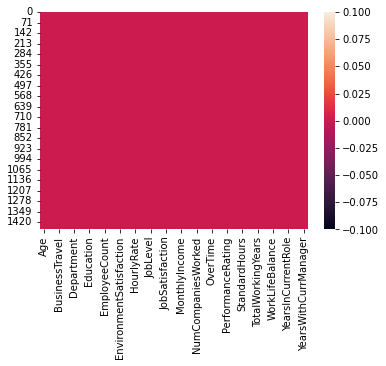

In [8]:
sns.heatmap(HR.isnull())

We can check through visualization also that there is no Null Value present in our Dataset.

In [10]:
HR[HR['Attrition'] == ''].index

Int64Index([], dtype='int64')

So, we can check there are no blank value present in our Target Column

In [11]:
# Checking whether the dataset contains any space
HR[HR['Attrition'] == '']

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager


So we can see there are no spaces present in the dataset.

### Checking unique values present in the Target Variable.

In [12]:
HR['Attrition'].unique()

array(['Yes', 'No'], dtype=object)

In [13]:
HR['Attrition'].nunique()

2

### Checking unique elements in each columns

In [13]:
HR.nunique()

Age                           43
Attrition                      2
BusinessTravel                 3
DailyRate                    886
Department                     3
DistanceFromHome              29
Education                      5
EducationField                 6
EmployeeCount                  1
EmployeeNumber              1470
EnvironmentSatisfaction        4
Gender                         2
HourlyRate                    71
JobInvolvement                 4
JobLevel                       5
JobRole                        9
JobSatisfaction                4
MaritalStatus                  3
MonthlyIncome               1349
MonthlyRate                 1427
NumCompaniesWorked            10
Over18                         1
OverTime                       2
PercentSalaryHike             15
PerformanceRating              2
RelationshipSatisfaction       4
StandardHours                  1
StockOptionLevel               4
TotalWorkingYears             40
TrainingTimesLastYear          7
WorkLifeBa

### Total Values in the target variable

In [14]:
HR['Attrition'].value_counts()

No     1233
Yes     237
Name: Attrition, dtype: int64

## Dropping irrelevant columns

In [16]:
HR=HR.drop(columns="EmployeeNumber", axis=1)

In [18]:
# Description of Dataset : works only on continuous column 
HR.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,2.721769,65.891156,2.729932,2.063946,2.728571,...,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,1.093082,20.329428,0.711561,1.106940,1.102846,...,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,30.000000,1.000000,1.000000,1.000000,...,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,2.000000,48.000000,2.000000,1.000000,2.000000,...,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,3.000000,66.000000,3.000000,2.000000,3.000000,...,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,4.000000,83.750000,3.000000,3.000000,4.000000,...,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,4.000000,100.000000,4.000000,5.000000,4.000000,...,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


### Checking Description through heatmap also.

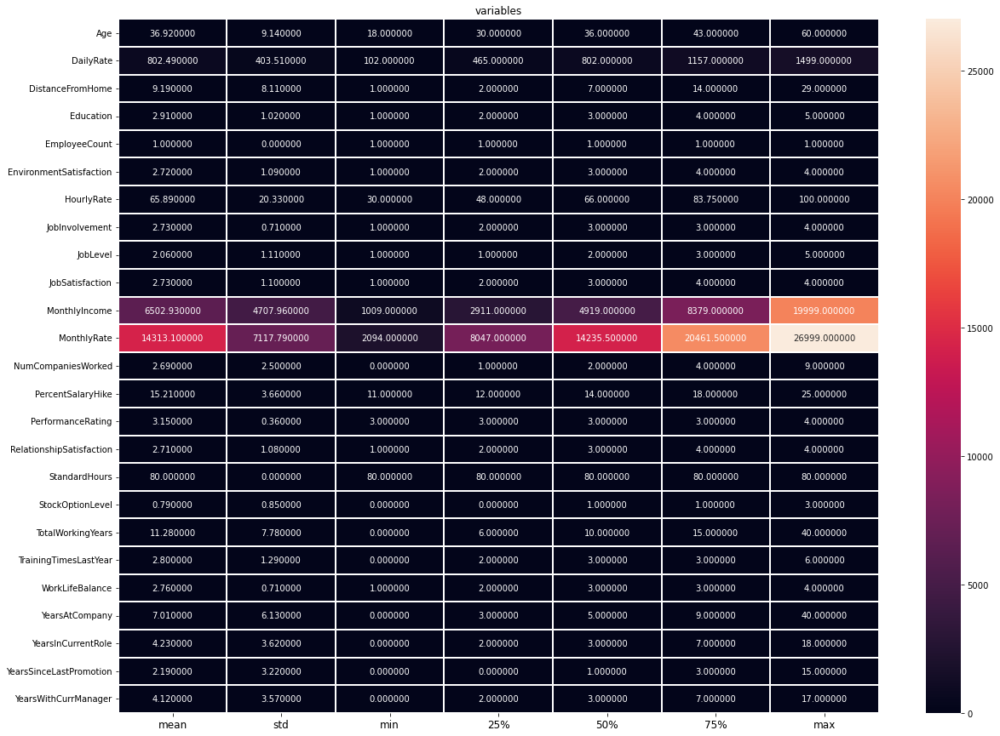

In [19]:
plt.figure(figsize=(20,15))
sns.heatmap(round(HR.describe()[1:].transpose(),2),linewidth=2,annot=True,fmt='f')
plt.xticks(fontsize=18)
plt.xticks(fontsize=12)
plt.title('variables')
plt.show()

### Observation of Describe of Datasets:

- The summary of this dataset looks good as there are no negative/ invalid value present.
- We can see the counts of all the columns are 30 which means no null values are present.
- Total No of Rows: 1470 and Total No. of Columns: 35
- We are determining Mean, Standard Deviation, Minimum and Maximum Values of each column:
'Age','DailyRate','DistanceFromHome','Education','EmployeeCount','EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement', 'JobLevel', 'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel','TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion','YearsWithCurrManager', 'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 'PerformanceRating'
- In most columns mean and 50% have same value.
- Also mean is greater than standard deviation.
- Columns: TotalWorkingYears,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager have a big difference between 75% and max.

- __We can observe that the dataset seems to be having more outliers as well as skewness in the data on the basis of Quantile median result.__

## Data Visualization

### Univariate Analysis

### Using Countplot for categorical columns

No     1233
Yes     237
Name: Attrition, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='count'>

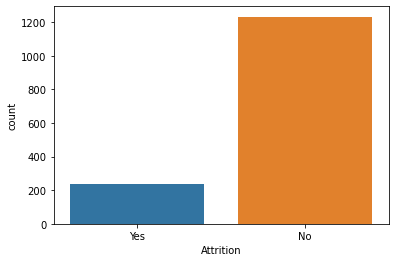

In [20]:
#Countplot for "Attrition" column
print(HR['Attrition'].value_counts())
sns.countplot('Attrition',data=HR)

We can see 237 employee have left company and 1233 still working.

Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64


<AxesSubplot:xlabel='BusinessTravel', ylabel='count'>

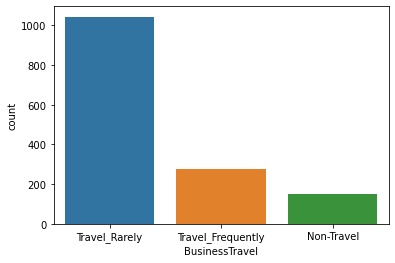

In [21]:
#Countplot for "BusinessTravel" column
print(HR['BusinessTravel'].value_counts())
sns.countplot('BusinessTravel',data=HR)

We can see total numbers of employees travels frequently for business purpose are 277, those who travel rarely are 1043 and those who never travelled are 150.

Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64


<AxesSubplot:xlabel='Department', ylabel='count'>

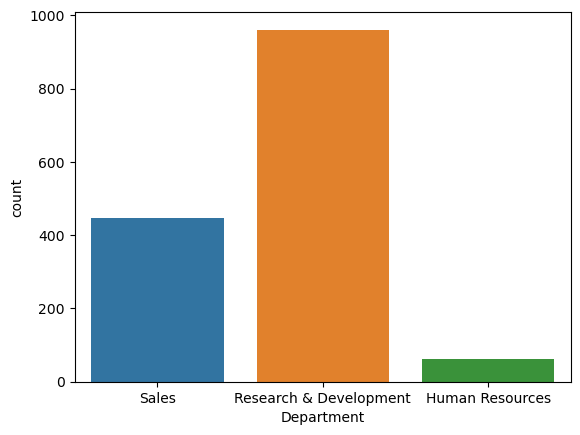

In [17]:
#Countplot for "Department" column
print(HR['Department'].value_counts())
sns.countplot('Department',data=HR)

We can see there are 3 department in company: Sales, Research & Development and Human Resource Department. Total no of  employees in these departments are:
- In Sales are 446
- In Research & Development are 961
- In HR are 63

Male      882
Female    588
Name: Gender, dtype: int64


<AxesSubplot:xlabel='Gender', ylabel='count'>

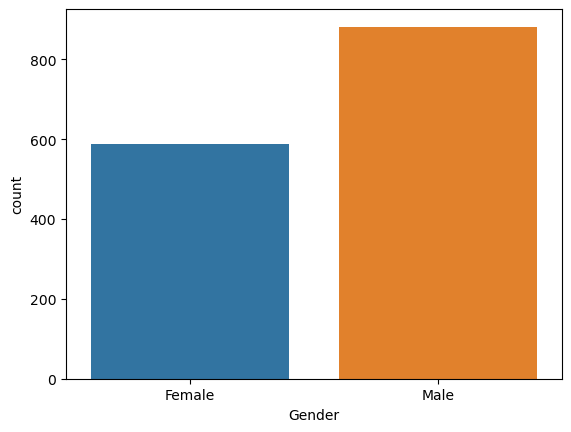

In [16]:
#Countplot for "Gender" column
print(HR['Gender'].value_counts())
sns.countplot('Gender',data=HR)

The total number of male employees in the company is 882 and female employees are 588.

Life Sciences       606
Medical             464
Marketing           159
Technical Degree    132
Other                82
Human Resources      27
Name: EducationField, dtype: int64


<AxesSubplot:xlabel='EducationField', ylabel='count'>

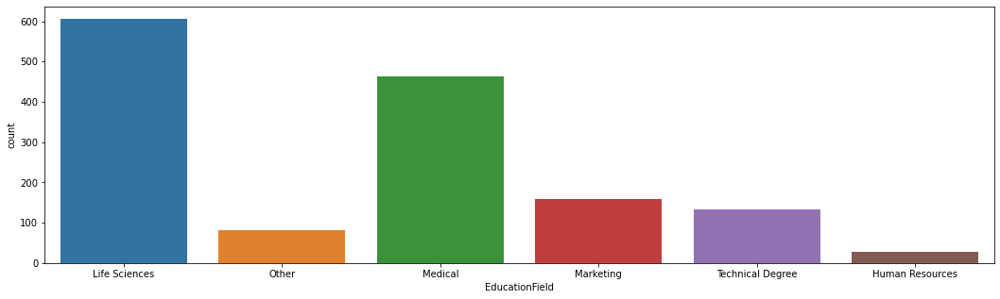

In [24]:
#Countplot for "EducationField" column
print(HR['EducationField'].value_counts())
plt.figure(figsize=(18,5))
sns.countplot('EducationField',data=HR)

We can see, educational background of employees working in company:
- 606 employees have studied Life Sciences 
- 464 employees have studied Medical
- 159 employees have studied Marketing
- 132 employees have studied Technical Degree
- 82 employees have studied Other
- 27 employees have studied Human Resources  

Sales Executive              326
Research Scientist           292
Laboratory Technician        259
Manufacturing Director       145
Healthcare Representative    131
Manager                      102
Sales Representative          83
Research Director             80
Human Resources               52
Name: JobRole, dtype: int64


<AxesSubplot:xlabel='JobRole', ylabel='count'>

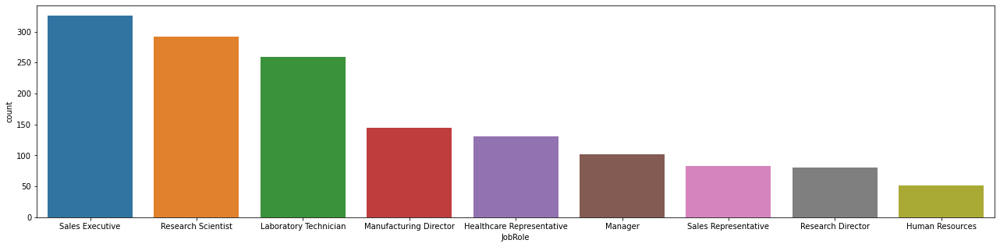

In [25]:
#Countplot for "JobRole" column
plt.figure(figsize=(22,5))
print(HR['JobRole'].value_counts())
sns.countplot('JobRole',data=HR)

We can see 9 job roles are present in the company and various number of employees are working under these job roles:
- 326 employees are working as Sales Executive
- 292 employees are working as Research Scientist
- 259 employees are working as Laboratory Technician
- 145 employees are working as Manufacturing Director
- 131 employees are working as Healthcare Representative
- 102 employees are working as Manager
- 83 employees are working as Sales Representative
- 80 employees are working as Research Director
- 52 employees are working as Human Resources

Married     673
Single      470
Divorced    327
Name: MaritalStatus, dtype: int64


<AxesSubplot:xlabel='MaritalStatus', ylabel='count'>

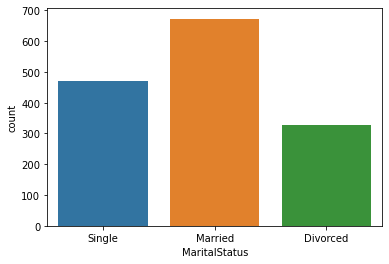

In [26]:
#Countplot for "MaritalStatus" column
print(HR['MaritalStatus'].value_counts())
sns.countplot('MaritalStatus',data=HR)

We can see, Married employees are 673, Single employees are 470 and Divorced employees are 327 in the company.

Y    1470
Name: Over18, dtype: int64


<AxesSubplot:xlabel='Over18', ylabel='count'>

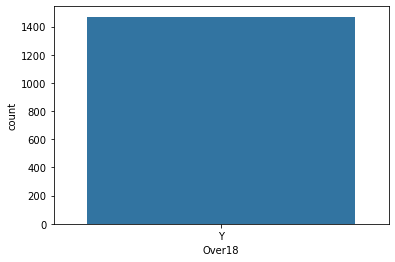

In [27]:
#Countplot for "Over18" column
print(HR['Over18'].value_counts())
sns.countplot('Over18',data=HR)

We can see that there is only one attribute and that is yes for column 'Over18', so it have no relation with our target column and we will drop this column.

No     1054
Yes     416
Name: OverTime, dtype: int64


<AxesSubplot:xlabel='OverTime', ylabel='count'>

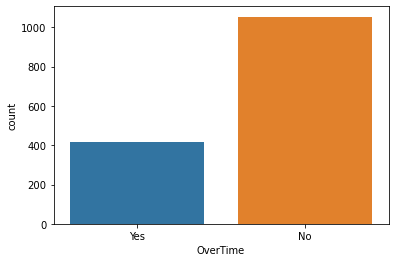

In [28]:
#Countplot for "OverTime" column
print(HR['OverTime'].value_counts())
sns.countplot('OverTime',data=HR)

We can see employees doing overtime are 416 and not doing are 1054

### Using Distplot for continuous columns

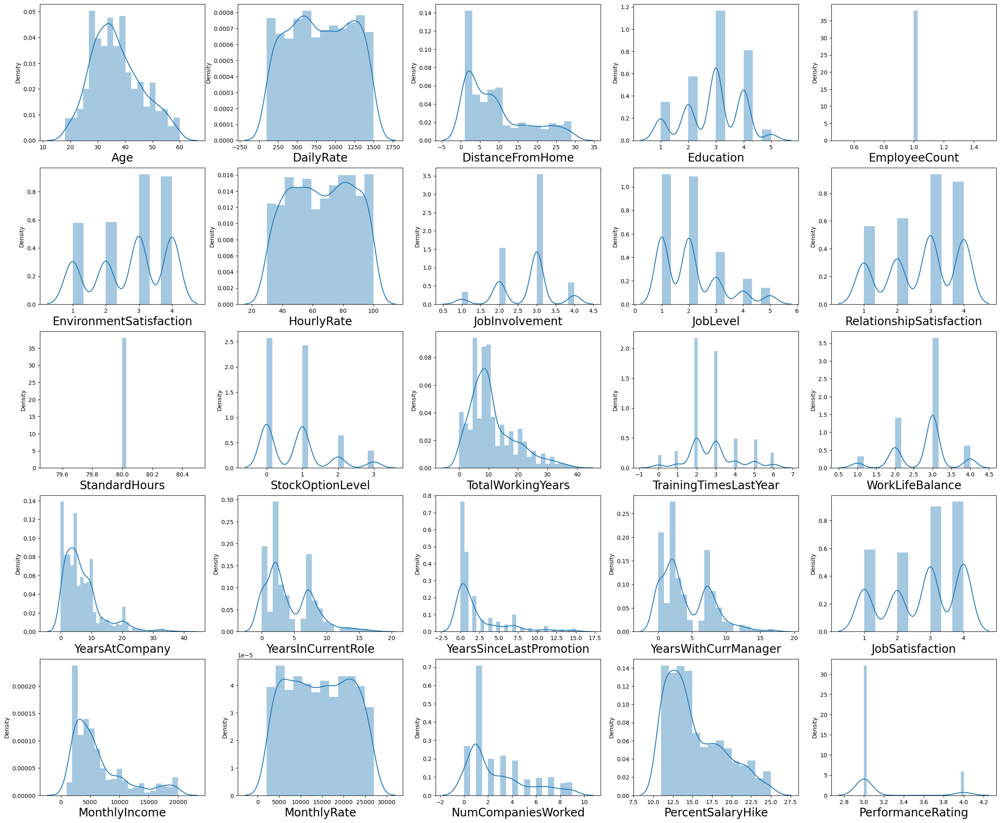

In [18]:
collist=['Age','DailyRate','DistanceFromHome','Education','EmployeeCount','EnvironmentSatisfaction', 'HourlyRate',
         'JobInvolvement','JobLevel','RelationshipSatisfaction','StandardHours', 'StockOptionLevel','TotalWorkingYears', 
         'TrainingTimesLastYear', 'WorkLifeBalance','YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
         'YearsWithCurrManager', 'JobSatisfaction','MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 
         'PerformanceRating']

plt.figure(figsize=(30,25))
plotnumber = 1

for column in HR[collist]:
    if plotnumber<=25:
        ax = plt.subplot(5,5,plotnumber)
        sns.distplot(HR[column])
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.show()

### Bivariate Analysis

#### Using Barplot

[41 49 37 33 27 32 59 30 38 36 35 29 31 34 28 22 53 24 21 42 44 46 39 43
 50 26 48 55 45 56 23 51 40 54 58 20 25 19 57 52 47 18 60]


<AxesSubplot:xlabel='Attrition', ylabel='Age'>

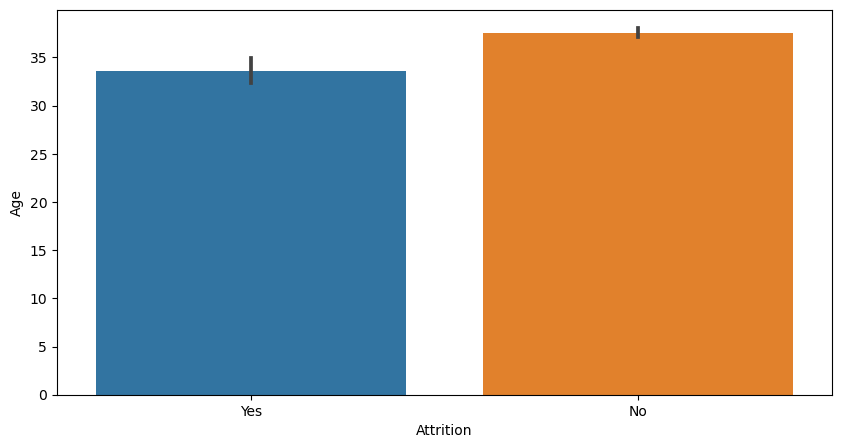

In [19]:
#Barplot for comparision between "Age" and "Attrition" column
print(HR['Age'].unique())
plt.figure(figsize=(10,5))
sns.barplot(y='Age', x='Attrition', data=HR)

We can see those employee's whose age is more than 38 are still in the company and those employees whose age is between 18 to 34 have left the company

<AxesSubplot:xlabel='Attrition', ylabel='DailyRate'>

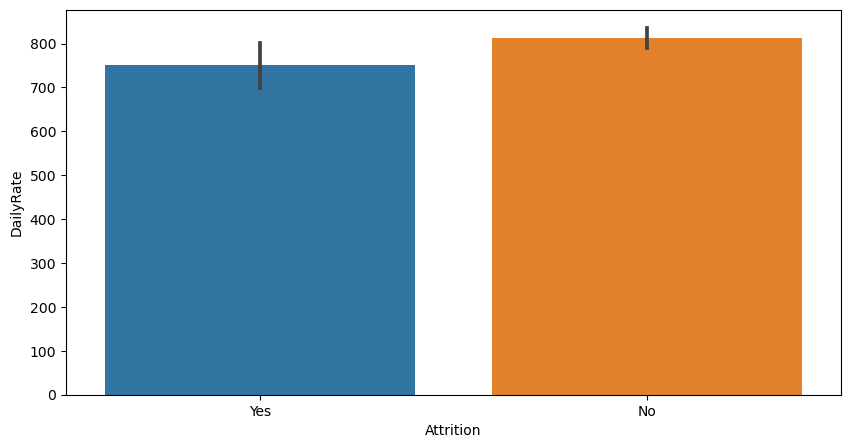

In [20]:
#barplot for comparision between "DailyRate" and "Attrition" column
plt.figure(figsize=(10,5))
sns.barplot(y='DailyRate', x='Attrition', data=HR)

We can see DailyRate of Attrition in the company is 750 and DailyRate of Attrition not in the company is 800

<AxesSubplot:xlabel='Attrition', ylabel='DistanceFromHome'>

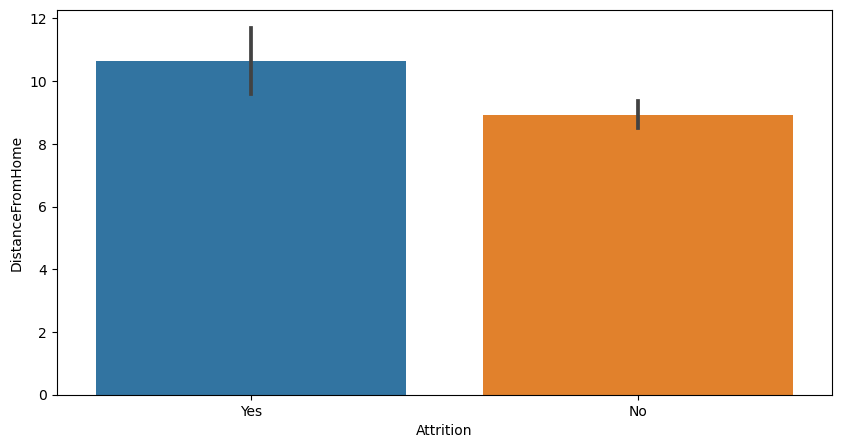

In [21]:
#barplot for comparision between "DistanceFromHome" and "Attrition" column
#print(HR['DistanceFromHome'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='DistanceFromHome', x='Attrition', data=HR)

We can see Attrition is more for DistanceFromHome to company is 11 and those not is 9

3    572
4    398
2    282
1    170
5     48
Name: Education, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='Education'>

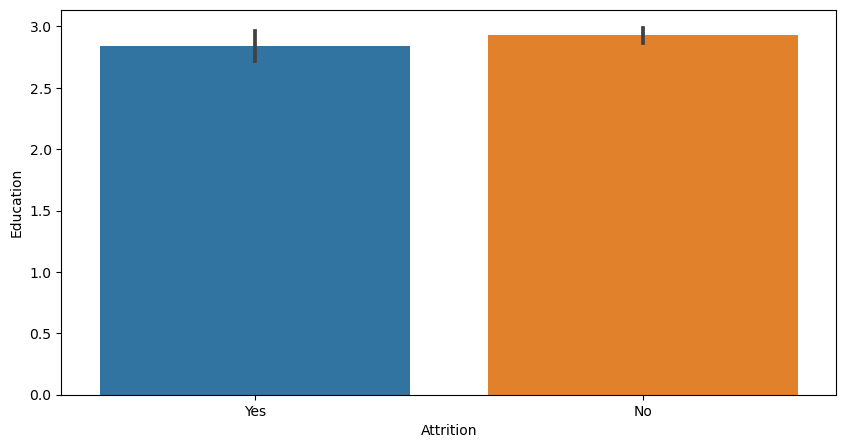

In [22]:
#Barplot for comparision between "Education" and "Attrition" column
print(HR['Education'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='Education', x='Attrition', data=HR)

More Educated employees are in the company and less Educated employees are not in the company.

1    1470
Name: EmployeeCount, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='EmployeeCount'>

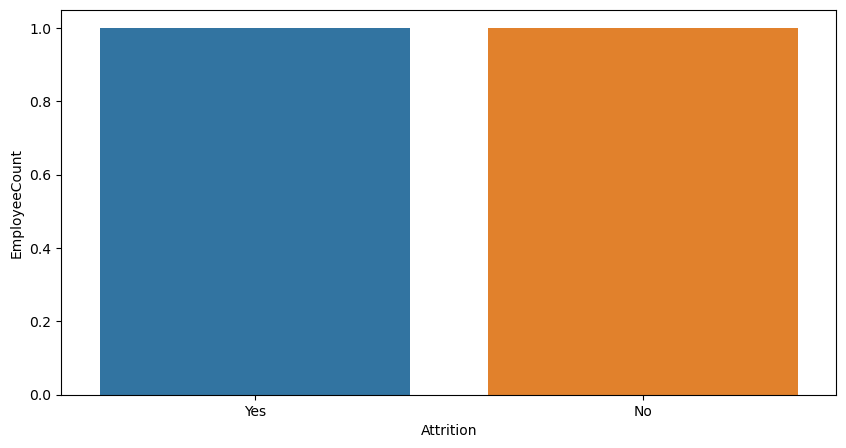

In [23]:
#Barplot for comparision between "EmployeeCount" and "Attrition" column
print(HR['EmployeeCount'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='EmployeeCount', x='Attrition', data=HR)

We will drop column 'EmployeeCount' as it have only one value "1470" and it have no relation with target variable.

3    453
4    446
2    287
1    284
Name: EnvironmentSatisfaction, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='EnvironmentSatisfaction'>

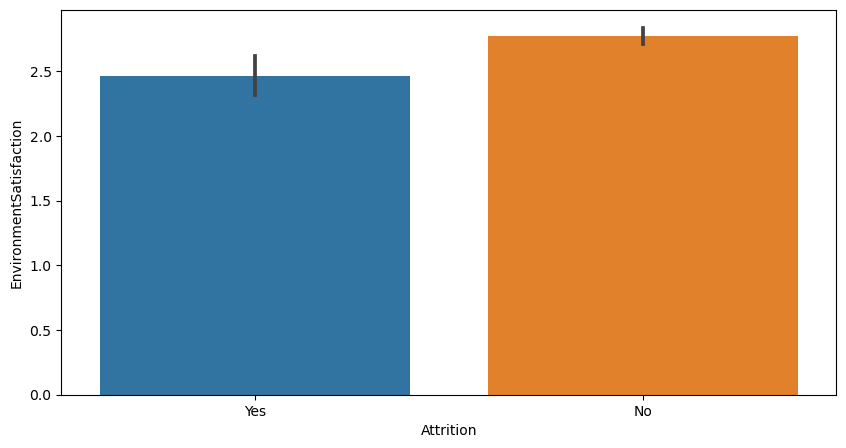

In [24]:
#Barplot for comparision between "EnvironmentSatisfaction" and "Attrition" column
print(HR['EnvironmentSatisfaction'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='EnvironmentSatisfaction', x='Attrition', data=HR)

Employees not satisfied with environment have left company and it is less compare to employees who are satisfied with environment.

66    29
98    28
42    28
48    28
84    28
      ..
31    15
53    14
68    14
38    13
34    12
Name: HourlyRate, Length: 71, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='HourlyRate'>

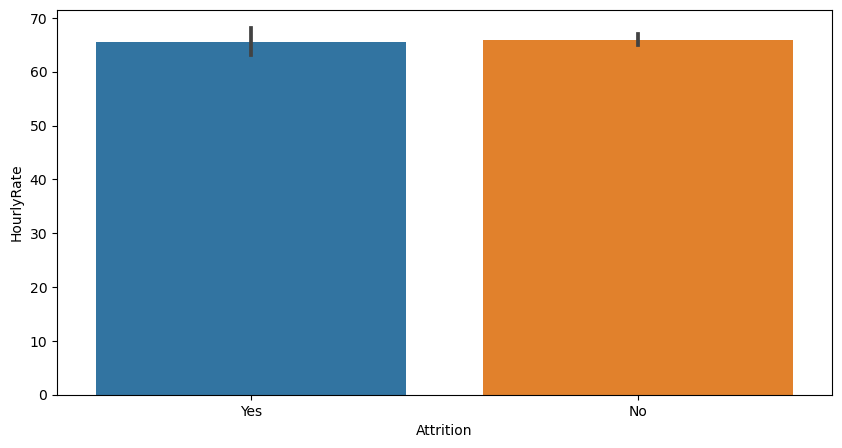

In [25]:
#Barplot for comparision between "HourlyRate" and "Attrition" column
print(HR['HourlyRate'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='HourlyRate', x='Attrition', data=HR)

Those employees left and still in company are equal as per hourly rate. So, we will drop this column as well.

3    868
2    375
4    144
1     83
Name: JobInvolvement, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='JobInvolvement'>

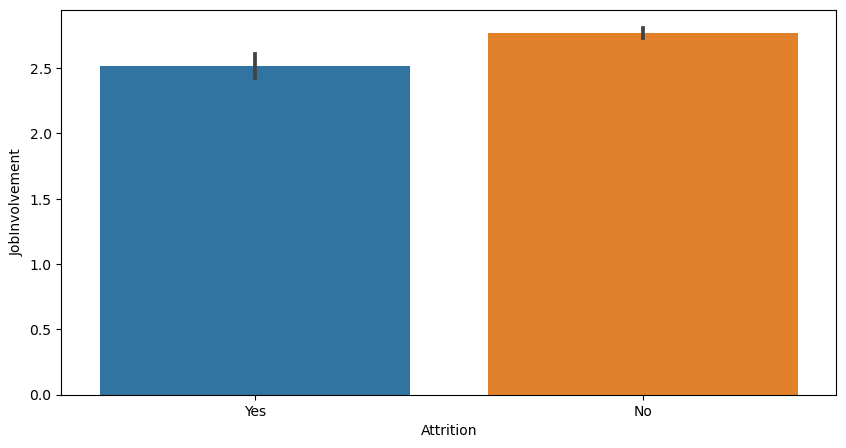

In [26]:
#Barplot for comparision between "JobInvolvement" and "Attrition" column
print(HR['JobInvolvement'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='JobInvolvement', x='Attrition', data=HR)

Employees involved most in jobs are in the company.

1    543
2    534
3    218
4    106
5     69
Name: JobLevel, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='JobLevel'>

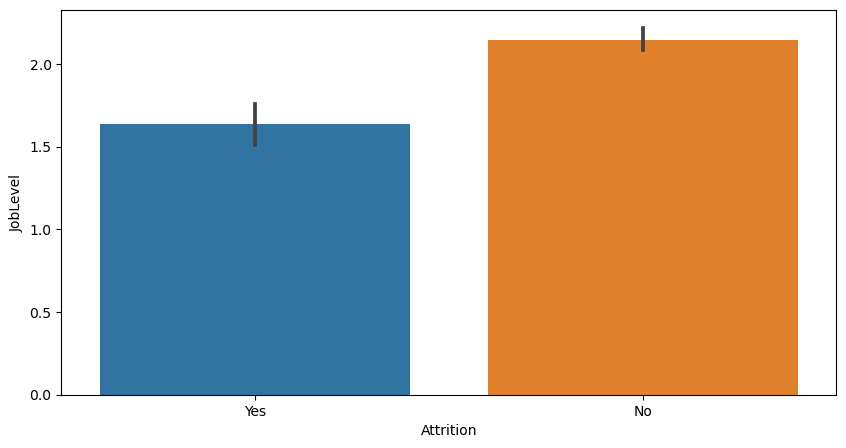

In [27]:
#Barplot for comparision between "JobLevel" and "Attrition" column
print(HR['JobLevel'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='JobLevel', x='Attrition', data=HR)

Attrition is less due to Level of Job in company 

3    459
4    432
2    303
1    276
Name: RelationshipSatisfaction, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='RelationshipSatisfaction'>

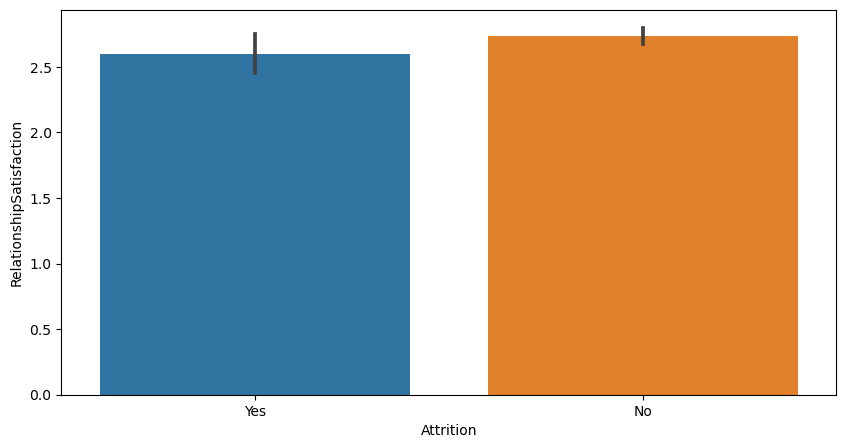

In [28]:
#Barplot for comparision between "RelationshipSatisfaction" and "Attrition" column
print(HR['RelationshipSatisfaction'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='RelationshipSatisfaction', x='Attrition', data=HR)

Employess are satisfied more due to relationship with company or employees

80    1470
Name: StandardHours, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='StandardHours'>

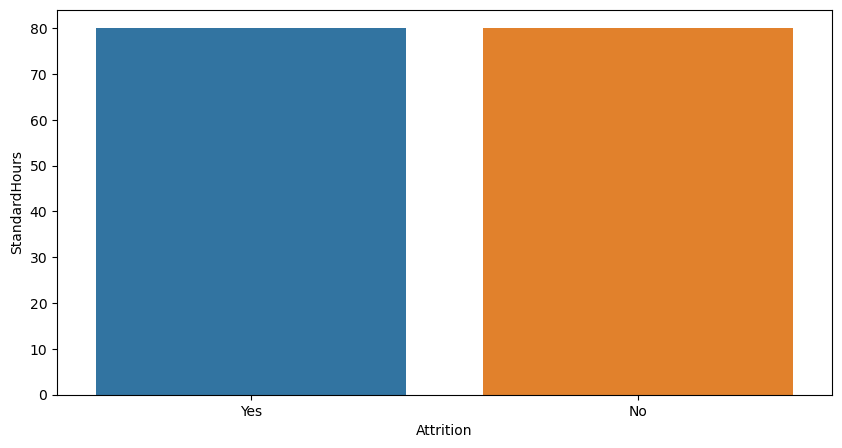

In [29]:
#Barplot for comparision between "StandardHours" and "Attrition" column
print(HR['StandardHours'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='StandardHours', x='Attrition', data=HR)

This column "StandardHours" have also only one value. So, we will also drop this column as it have no relation with Target column "Attrition".

0    631
1    596
2    158
3     85
Name: StockOptionLevel, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='StockOptionLevel'>

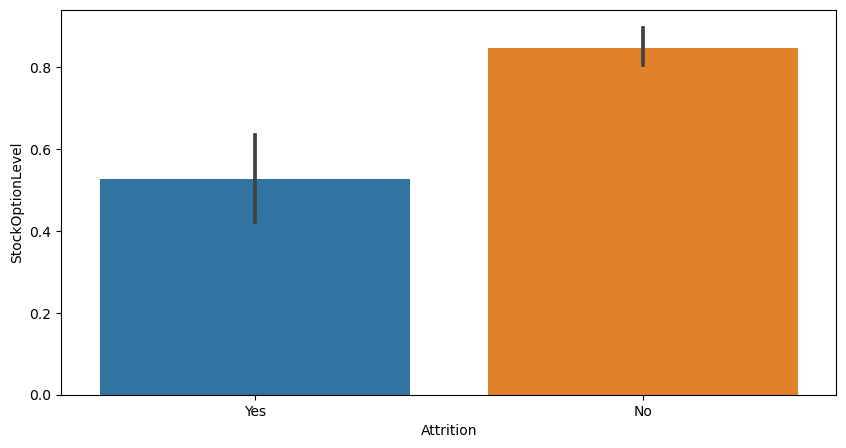

In [30]:
#Barplot for comparision between "StockOptionLevel" and "Attrition" column
print(HR['StockOptionLevel'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='StockOptionLevel', x='Attrition', data=HR)

Stock option level for attrition is less

<AxesSubplot:xlabel='Attrition', ylabel='TotalWorkingYears'>

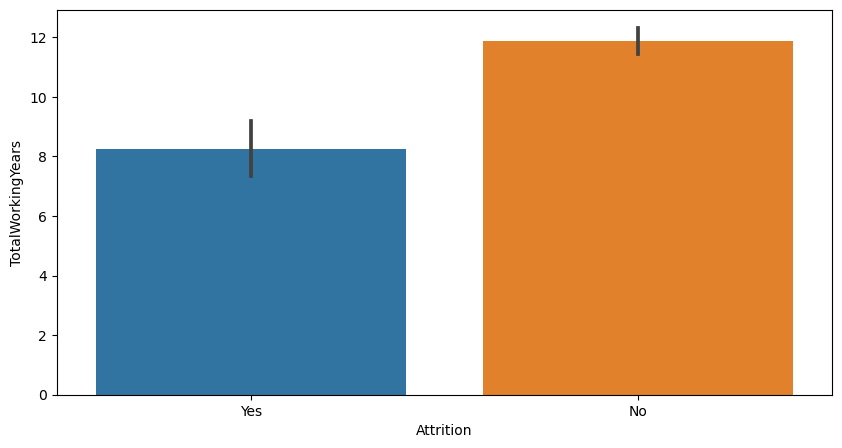

In [31]:
#Barplot for comparision between "TotalWorkingYears" and "Attrition" column
#print(HR['TotalWorkingYears'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='TotalWorkingYears', x='Attrition', data=HR)

Experienced employees who have more experience are still in company and those whose experience level is less are not in the company.

2    547
3    491
4    123
5    119
1     71
6     65
0     54
Name: TrainingTimesLastYear, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='TrainingTimesLastYear'>

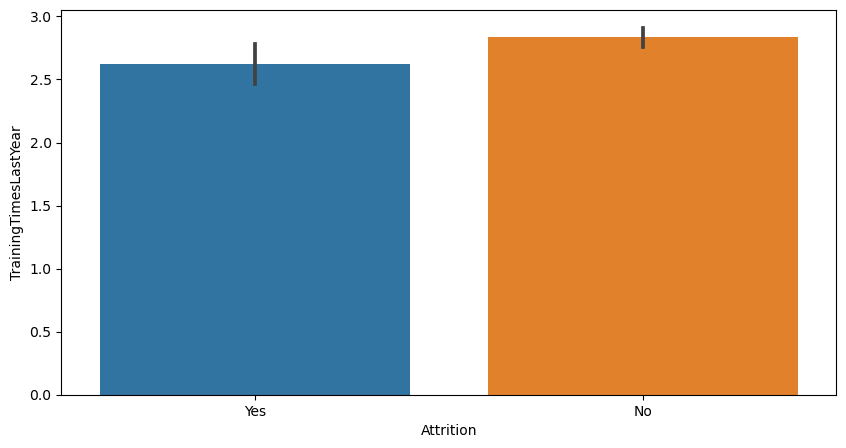

In [32]:
#Barplot for comparision between "TrainingTimesLastYear" and "Attrition" column
print(HR['TrainingTimesLastYear'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='TrainingTimesLastYear', x='Attrition', data=HR)

Training time is high in last year so attritiom is less

<AxesSubplot:xlabel='Attrition', ylabel='WorkLifeBalance'>

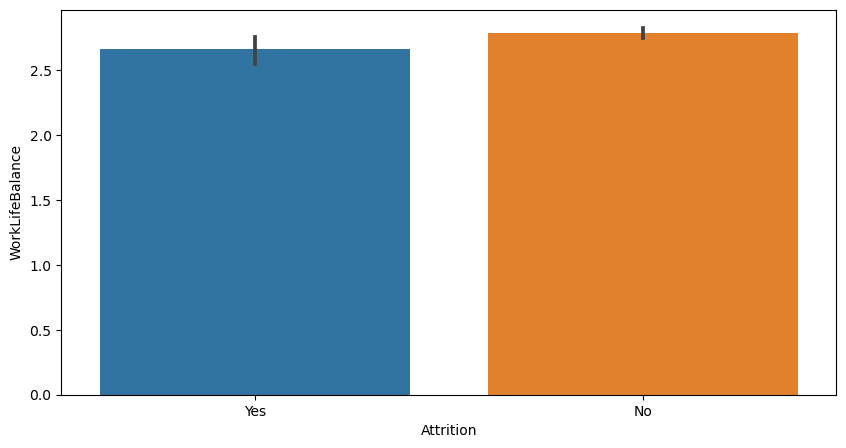

In [33]:
#Barplot for comparision between "WorkLifeBalance" and "Attrition" column
#print(HR['WorkLifeBalance'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='WorkLifeBalance', x='Attrition', data=HR)

Employee working in company having balance in life is more

<AxesSubplot:xlabel='Attrition', ylabel='YearsAtCompany'>

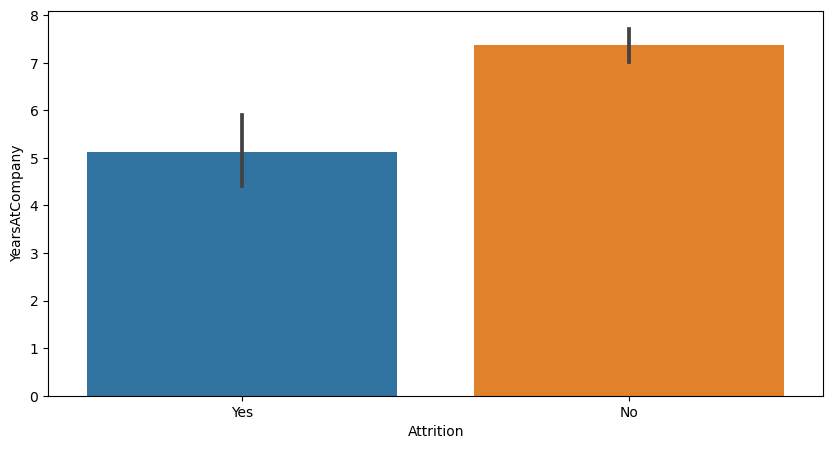

In [34]:
#Barplot for comparision between "YearsAtCompany" and "Attrition" column
#print(HR['YearsAtCompany'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='YearsAtCompany', x='Attrition', data=HR)

Employees working from many years at company is more than left employee

<AxesSubplot:xlabel='Attrition', ylabel='YearsInCurrentRole'>

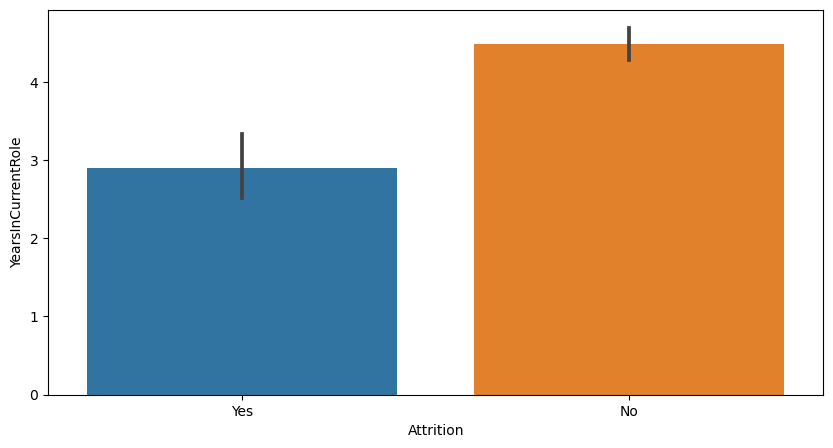

In [35]:
#Barplot for comparision between "YearsInCurrentRole" and "Attrition" column
#print(HR['YearsInCurrentRole'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='YearsInCurrentRole', x='Attrition', data=HR)

From many years having same role in company are more.

0     581
1     357
2     159
7      76
4      61
3      52
5      45
6      32
11     24
8      18
9      17
15     13
13     10
12     10
14      9
10      6
Name: YearsSinceLastPromotion, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='YearsSinceLastPromotion'>

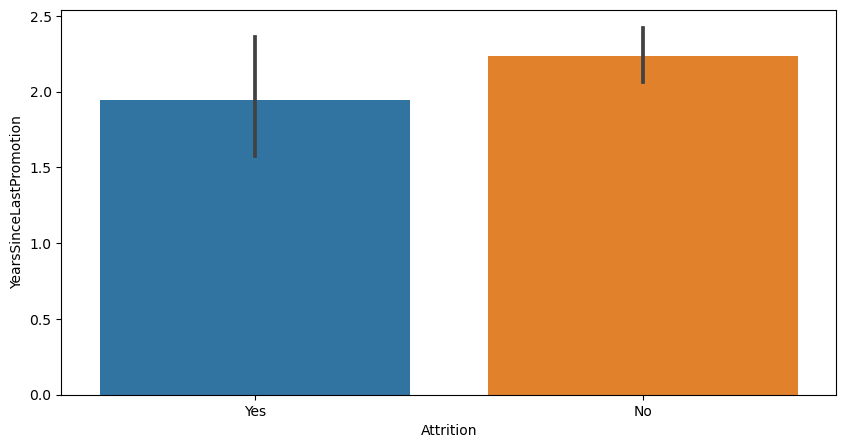

In [36]:
#Barplot for comparision between "YearsSinceLastPromotion" and "Attrition" column
print(HR['YearsSinceLastPromotion'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='YearsSinceLastPromotion', x='Attrition', data=HR)

Promotion chances are high in the company

2     344
0     263
7     216
3     142
8     107
4      98
1      76
9      64
5      31
6      29
10     27
11     22
12     18
13     14
17      7
15      5
14      5
16      2
Name: YearsWithCurrManager, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='YearsWithCurrManager'>

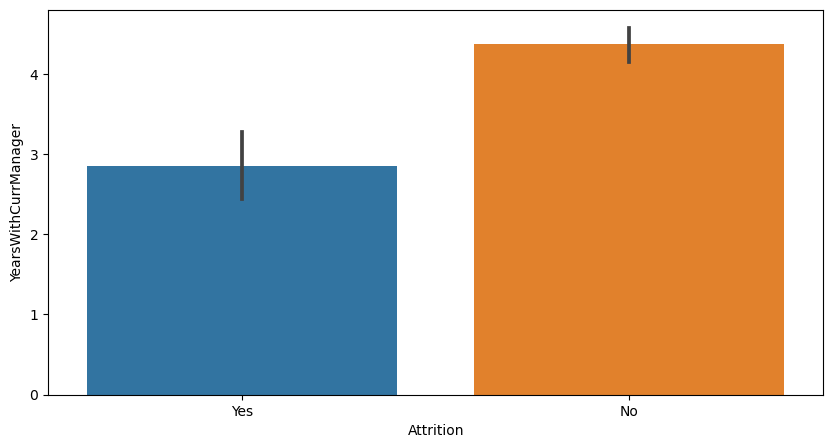

In [37]:
#Barplot for comparision between "YearsWithCurrManager" and "Attrition" column
print(HR['YearsWithCurrManager'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='YearsWithCurrManager', x='Attrition', data=HR)

Having same Manager is more from many years.

4    459
3    442
1    289
2    280
Name: JobSatisfaction, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='JobSatisfaction'>

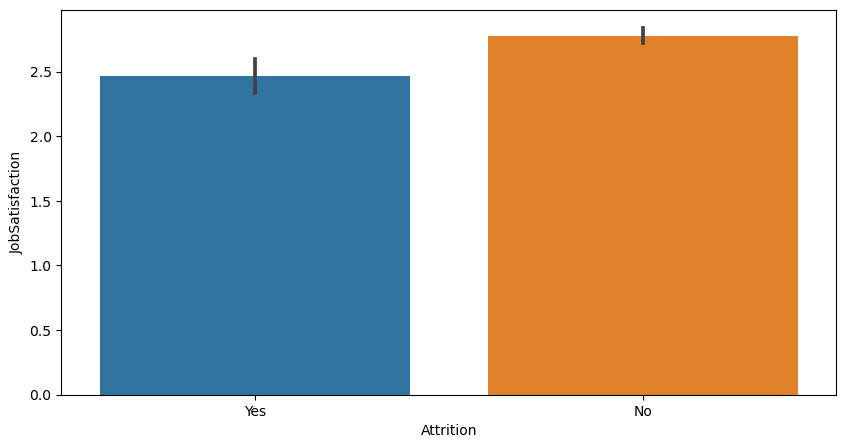

In [38]:
#Barplot for comparision between "JobSatisfaction" and "Attrition" column
print(HR['JobSatisfaction'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='JobSatisfaction', x='Attrition', data=HR)

Employees satisfied with job are more and still in company

<AxesSubplot:xlabel='Attrition', ylabel='MonthlyIncome'>

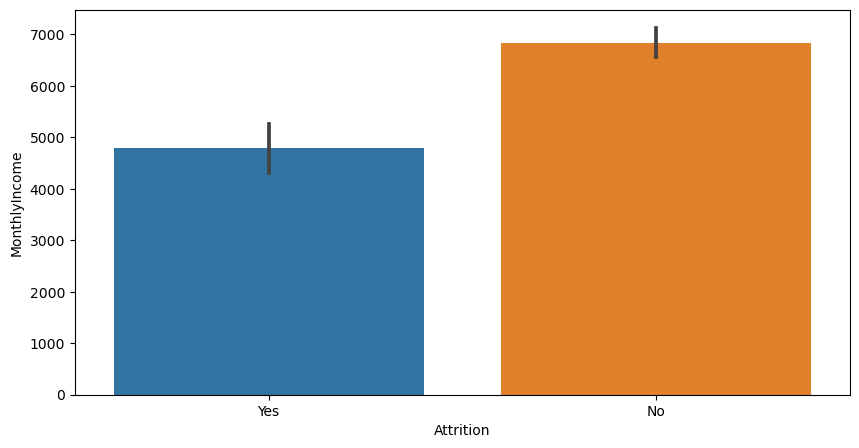

In [39]:
#Barplot for comparision between "MonthlyIncome" and "Attrition" column
#print(HR['MonthlyIncome'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='MonthlyIncome', x='Attrition', data=HR)

Employees getting monthly income is more than not getting and also left the company.

4223     3
9150     3
9558     2
12858    2
22074    2
        ..
14561    1
2671     1
5718     1
11757    1
10228    1
Name: MonthlyRate, Length: 1427, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='MonthlyRate'>

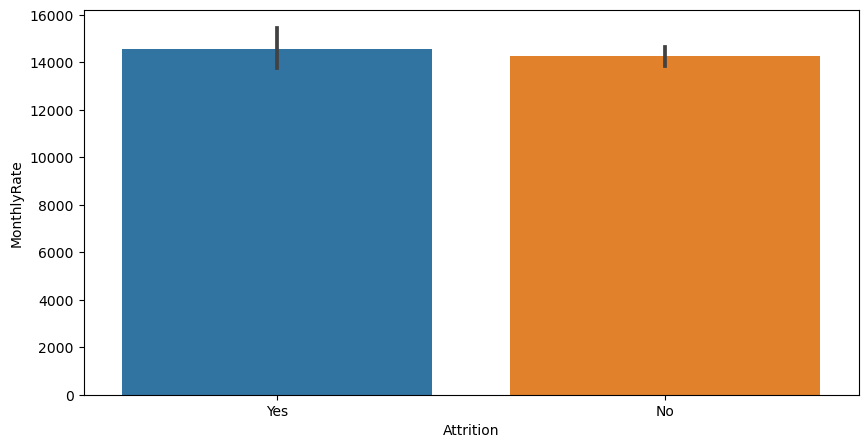

In [40]:
#Barplot for comparision between "MonthlyRate" and "Attrition" column
print(HR['MonthlyRate'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='MonthlyRate', x='Attrition', data=HR)

Not Monthly Rate is high

1    521
0    197
3    159
2    146
4    139
7     74
6     70
5     63
9     52
8     49
Name: NumCompaniesWorked, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='NumCompaniesWorked'>

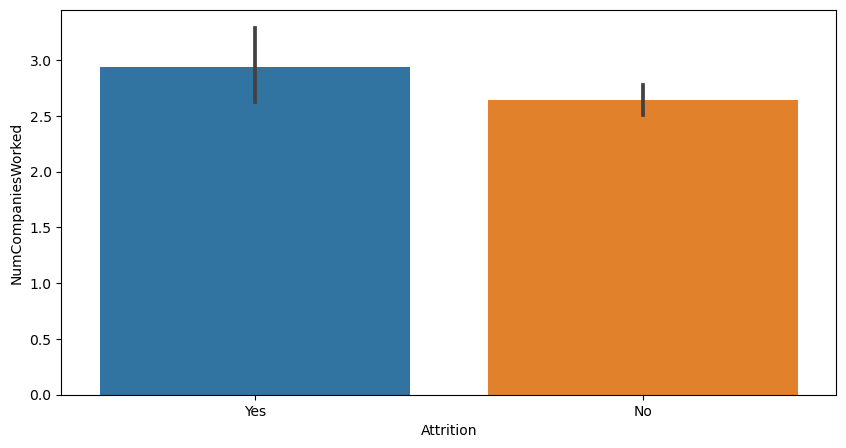

In [41]:
#Barplot for comparision between "NumCompaniesWorked" and "Attrition" column
print(HR['NumCompaniesWorked'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='NumCompaniesWorked', x='Attrition', data=HR)

Employees Worked with more companies are less.

11    210
13    209
14    201
12    198
15    101
18     89
17     82
16     78
19     76
22     56
20     55
21     48
23     28
24     21
25     18
Name: PercentSalaryHike, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='PercentSalaryHike'>

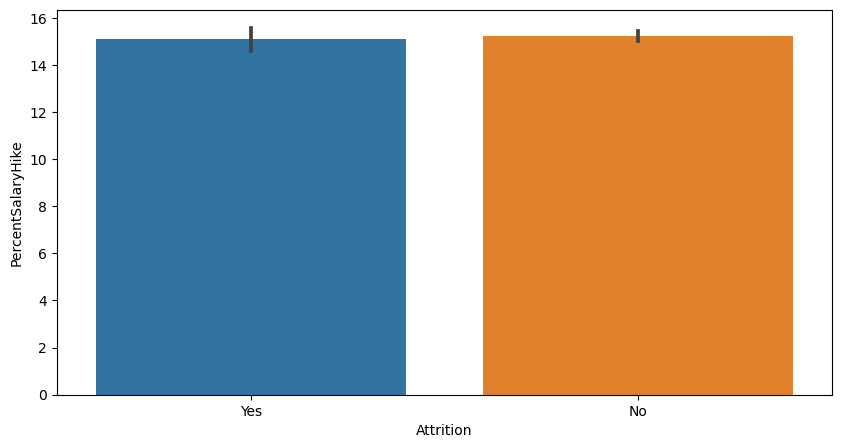

In [42]:
#Barplot for comparision between "PercentSalaryHike" and "Attrition" column
print(HR['PercentSalaryHike'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='PercentSalaryHike', x='Attrition', data=HR)

Percentage of salary hike is equal, so we will drop this column also.

3    1244
4     226
Name: PerformanceRating, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='PerformanceRating'>

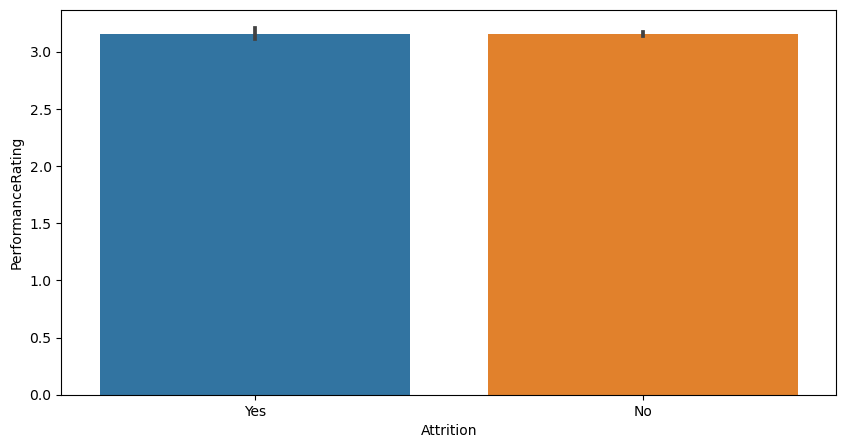

In [43]:
#Barplot for comparision between "PerformanceRating" and "Attrition" column
print(HR['PerformanceRating'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='PerformanceRating', x='Attrition', data=HR)

Rating of Performance is also same for both. So we will drop this column also.

### Multivariate Analysis

##### Using pairplot

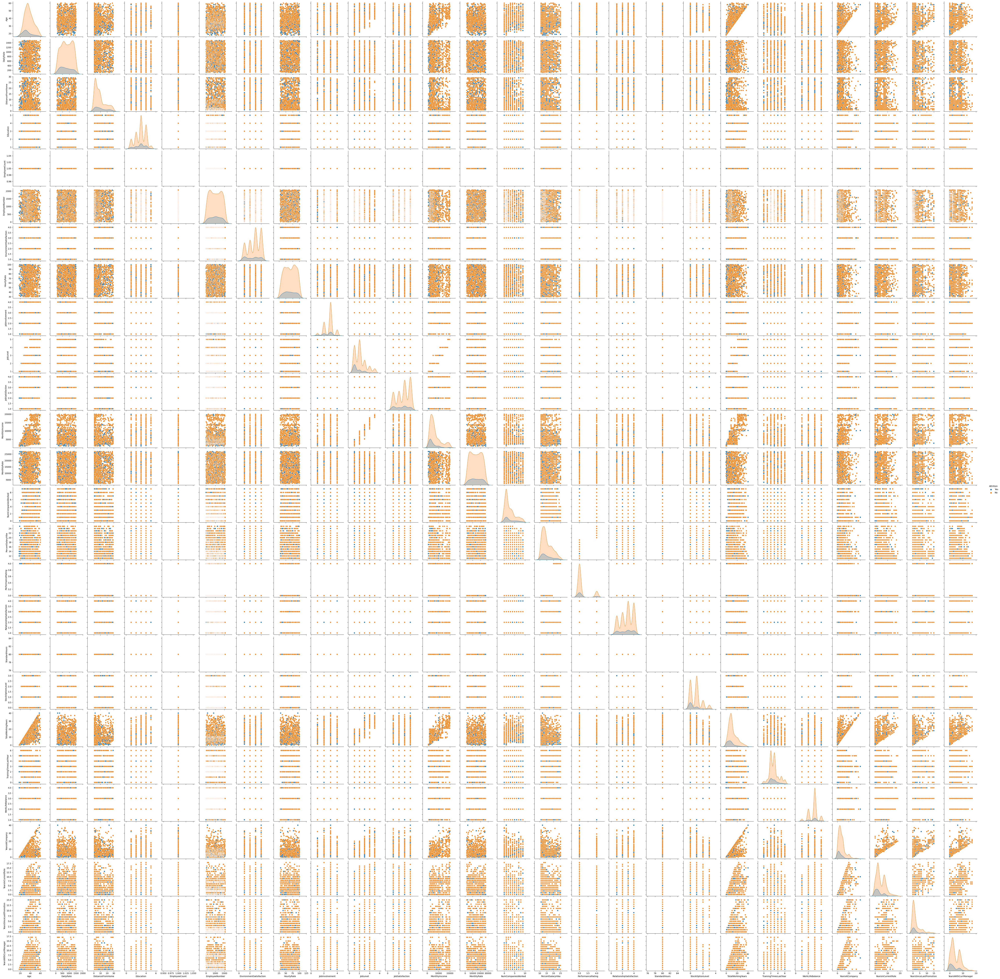

In [44]:
sns.pairplot(data=HR,hue="Attrition")

This pair plot gives the relation between the columns which are plotted on the basis of target variable 'Attrition'.

## Checking Correlation

In [45]:
HR.corr()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,0.010661,-0.001686,0.208034,NaN,-0.010145,0.010146,0.024287,0.029820,0.509604,...,0.053535,NaN,0.037510,0.680381,-0.019621,-0.021490,0.311309,0.212901,0.216513,0.202089
DailyRate,0.010661,1.000000,-0.004985,-0.016806,NaN,-0.050990,0.018355,0.023381,0.046135,0.002966,...,0.007846,NaN,0.042143,0.014515,0.002453,-0.037848,-0.034055,0.009932,-0.033229,-0.026363
DistanceFromHome,-0.001686,-0.004985,1.000000,0.021042,NaN,0.032916,-0.016075,0.031131,0.008783,0.005303,...,0.006557,NaN,0.044872,0.004628,-0.036942,-0.026556,0.009508,0.018845,0.010029,0.014406
Education,0.208034,-0.016806,0.021042,1.000000,NaN,0.042070,-0.027128,0.016775,0.042438,0.101589,...,-0.009118,NaN,0.018422,0.148280,-0.025100,0.009819,0.069114,0.060236,0.054254,0.069065
EmployeeCount,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EmployeeNumber,-0.010145,-0.050990,0.032916,0.042070,NaN,1.000000,0.017621,0.035179,-0.006888,-0.018519,...,-0.069861,NaN,0.062227,-0.014365,0.023603,0.010309,-0.011240,-0.008416,-0.009019,-0.009197
EnvironmentSatisfaction,0.010146,0.018355,-0.016075,-0.027128,NaN,0.017621,1.000000,-0.049857,-0.008278,0.001212,...,0.007665,NaN,0.003432,-0.002693,-0.019359,0.027627,0.001458,0.018007,0.016194,-0.004999
HourlyRate,0.024287,0.023381,0.031131,0.016775,NaN,0.035179,-0.049857,1.000000,0.042861,-0.027853,...,0.001330,NaN,0.050263,-0.002334,-0.008548,-0.004607,-0.019582,-0.024106,-0.026716,-0.020123
JobInvolvement,0.029820,0.046135,0.008783,0.042438,NaN,-0.006888,-0.008278,0.042861,1.000000,-0.012630,...,0.034297,NaN,0.021523,-0.005533,-0.015338,-0.014617,-0.021355,0.008717,-0.024184,0.025976
JobLevel,0.509604,0.002966,0.005303,0.101589,NaN,-0.018519,0.001212,-0.027853,-0.012630,1.000000,...,0.021642,NaN,0.013984,0.782208,-0.018191,0.037818,0.534739,0.389447,0.353885,0.375281


This gives the correlation between the denpendent and independent variables.

In [46]:
HR=HR.drop(columns="Over18", axis=1)

In [47]:
HR=HR.drop(columns="EmployeeCount", axis=1)

In [48]:
HR=HR.drop(columns="StandardHours", axis=1)

In [49]:
HR.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeNumber',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

In [50]:
HR.shape

(1470, 32)

#### checking correlation with heatmap

<AxesSubplot:>

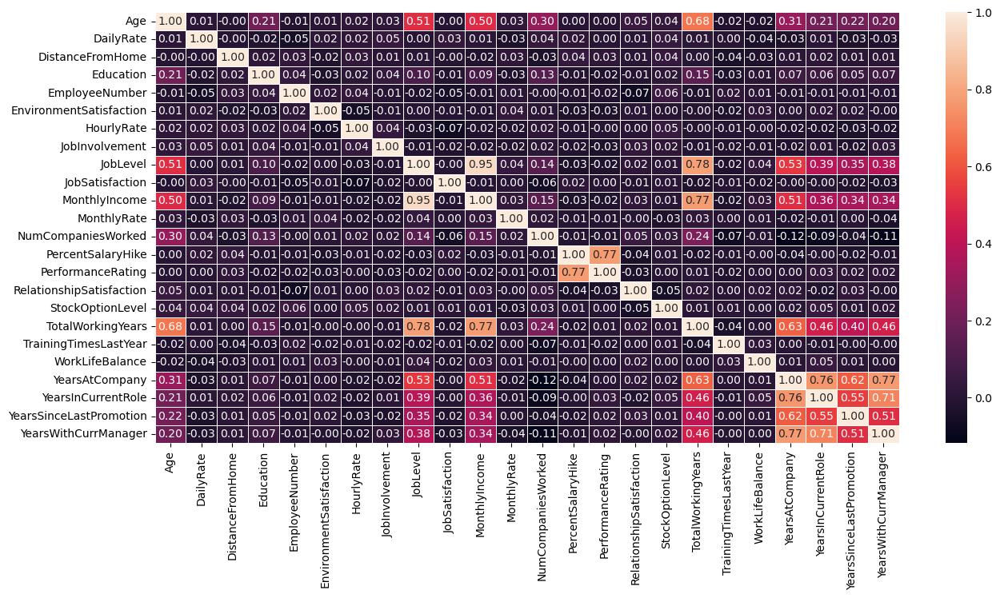

In [51]:
plt.figure(figsize=(15,7))
sns.heatmap(HR.corr(),annot=True, linewidth=0.5, linecolor='white', fmt='.2f')

### Observation of Correlation
- "JobLevel" is correlated to Age as employees.
- "MonthlyIncome" is correlated related to joblevel.
- "PerformanceRating" is correlated to PercentSalaryHike.
- "TotalWorkingYears" is correlated to JobLevel.
- "YearsWithCurrManager" is correlated to "YearsAtCompany".
- "YearsAtCompany" is correlated to "YearsInCurrentRole".

## Label Encoding

In [52]:
encoder=LabelEncoder()

In [53]:
HR['Attrition']=encoder.fit_transform(HR['Attrition'])
HR['BusinessTravel']=encoder.fit_transform(HR['BusinessTravel'])
HR['Department']=encoder.fit_transform(HR['Department'])
HR['Gender']=encoder.fit_transform(HR['Gender'])
HR['EducationField']=encoder.fit_transform(HR['EducationField'])
HR['JobRole']=encoder.fit_transform(HR['JobRole'])
HR['MaritalStatus']=encoder.fit_transform(HR['MaritalStatus'])
HR['OverTime']=encoder.fit_transform(HR['OverTime'])

In [54]:
HR.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,2,1102,2,1,2,1,1,2,...,3,1,0,8,0,1,6,4,0,5
1,49,0,1,279,1,8,1,1,2,3,...,4,4,1,10,3,3,10,7,1,7
2,37,1,2,1373,1,2,2,4,4,4,...,3,2,0,7,3,3,0,0,0,0
3,33,0,1,1392,1,3,4,1,5,4,...,3,3,0,8,3,3,8,7,3,0
4,27,0,2,591,1,2,1,3,7,1,...,3,4,1,6,3,3,2,2,2,2


In [55]:
HR.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeNumber',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

## Checking Outliers

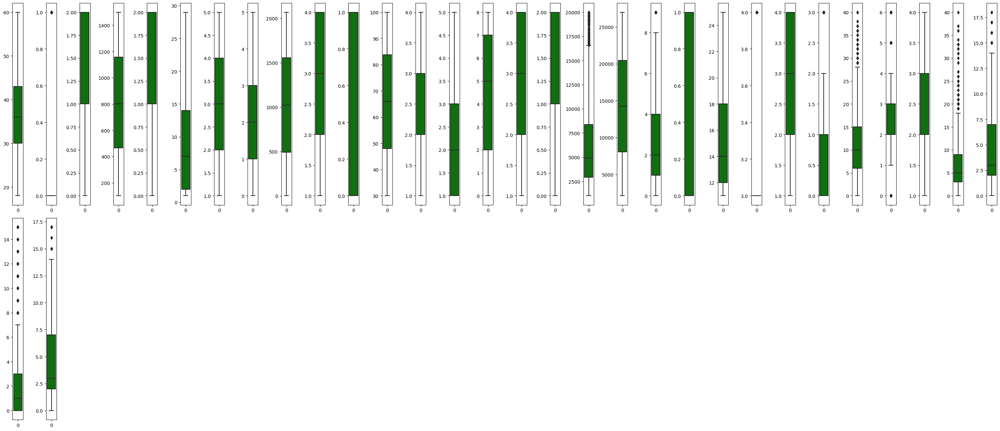

In [56]:
collist=HR.columns.values
ncol=30
nrows=14
plt.figure(figsize=(ncol,3*ncol))
for i in range(0,len(collist)):
    plt.subplot(nrows,ncol,i+1)
    sns.boxplot(data=HR[collist[i]],color='green',orient='v')
    plt.tight_layout()

### Observation:
    
- Outliers are present in all continuous columns: 'Attrition', 'MonthlyIncome', 'NumCompaniesWorked', 'PerformanceRating', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager'


- But we will not remove Outliers from 'Attrition' column as it is Target column.

## Removing Outliers

## 1. Zscore method using Scipy 

In [57]:
#  Outliers will be removed only from Continuous column variable.
# We will not remove outliers from Categorical column and Target Variable.

variable = HR[['MonthlyIncome', 'NumCompaniesWorked', 'PerformanceRating', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']]

z=np.abs(zscore(variable))

# Creating new dataframe for regression
HR_Analytics = HR[(z<3).all(axis=1)]
HR_Analytics.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,2,1102,2,1,2,1,1,2,...,3,1,0,8,0,1,6,4,0,5
1,49,0,1,279,1,8,1,1,2,3,...,4,4,1,10,3,3,10,7,1,7
2,37,1,2,1373,1,2,2,4,4,4,...,3,2,0,7,3,3,0,0,0,0
3,33,0,1,1392,1,3,4,1,5,4,...,3,3,0,8,3,3,8,7,3,0
4,27,0,2,591,1,2,1,3,7,1,...,3,4,1,6,3,3,2,2,2,2


In [58]:
print("Old DataFrame data in Rows and Column:",HR.shape)
print("New DataFrame data in Rows and Column:",HR_Analytics.shape)
print("Total Dropped rows:",HR.shape[0]-HR_Analytics.shape[0])

Old DataFrame data in Rows and Column: (1470, 32)
New DataFrame data in Rows and Column: (1387, 32)
Total Dropped rows: 83


### Percentage Data Loss using Zscore

In [59]:
loss_percent=(1470-1387)/1470*100
print(loss_percent,"%")

5.646258503401361 %


## 2. IQR (Inter Quantile Range) method

In [60]:
#1st quantile
Q1=variable.quantile(0.25)

# 3rd quantile
Q3=variable.quantile(0.75)

#IQR
IQR=Q3 - Q1
HR_projct=HR[~((HR < (Q1 - 1.5 * IQR)) |(HR > (Q3 + 1.5 * IQR))).any(axis=1)]

In [61]:
print("Old DataFrame data in Rows and Column:",HR.shape)
print("\nNew DataFrame data in Rows and Column:",HR_projct.shape)
print("\nTotal Dropped rows:",HR.shape[0]-HR_projct.shape[0])

Old DataFrame data in Rows and Column: (1470, 32)

New DataFrame data in Rows and Column: (779, 32)

Total Dropped rows: 691


### Percentage Data Loss using IQR

In [62]:
loss_perc = (1470-779)/1470*100
loss_perc

47.006802721088434

##### We can check by using IQR method there is large data loss in comparision to Zscore method. So, we will consider Zscore method.

## Checking for the skewness

In [63]:
HR_Analytics.skew()

Age                         0.472280
Attrition                   1.805983
BusinessTravel             -1.426774
DailyRate                  -0.017078
Department                  0.183919
DistanceFromHome            0.954752
Education                  -0.289024
EducationField              0.544868
EmployeeNumber              0.018931
EnvironmentSatisfaction    -0.325285
Gender                     -0.417296
HourlyRate                 -0.030481
JobInvolvement             -0.501401
JobLevel                    1.126075
JobRole                    -0.386843
JobSatisfaction            -0.345612
MaritalStatus              -0.160952
MonthlyIncome               1.544770
MonthlyRate                 0.030596
NumCompaniesWorked          1.037715
OverTime                    0.954751
PercentSalaryHike           0.800592
PerformanceRating           1.931566
RelationshipSatisfaction   -0.295686
StockOptionLevel            0.962332
TotalWorkingYears           1.034487
TrainingTimesLastYear       0.577614
W

#### Observation:
- There is skewness in many of the columns.

- Skewness threshold taken is +/-0.65. Columns which are having skewness:  'BusinessTravel','DistanceFromHome', 'JobLevel', 'MonthlyIncome', 'NumCompaniesWorked',
    'OverTime', 'PercentSalaryHike', 'PerformanceRating', 'StockOptionLevel', 'TotalWorkingYears', 'YearsAtCompany', 'YearsSinceLastPromotion', 
'YearsWithCurrManager', 'YearsSinceLastPromotion'. So, we will remove skewness from these columns.

#### Checking skewness through data visualization

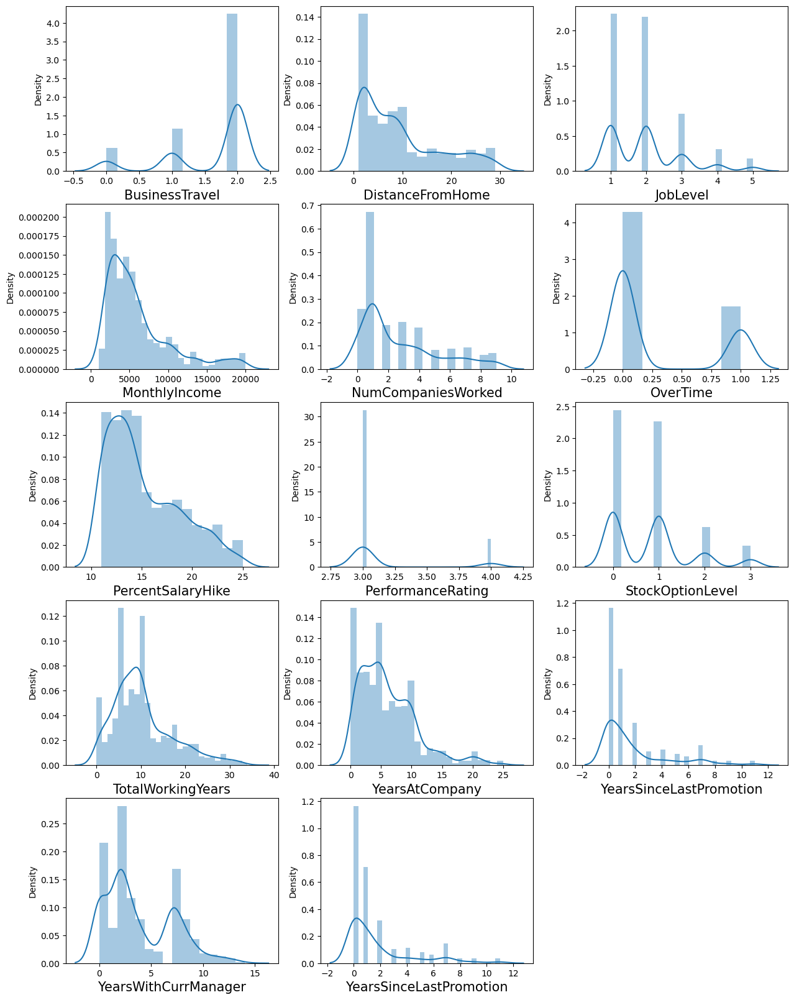

In [64]:
collist=[  'BusinessTravel', 'DistanceFromHome', 'JobLevel', 'MonthlyIncome', 'NumCompaniesWorked', 'OverTime', 'PercentSalaryHike', 'PerformanceRating', 'StockOptionLevel', 'TotalWorkingYears', 'YearsAtCompany', 'YearsSinceLastPromotion', 'YearsWithCurrManager', 'YearsSinceLastPromotion']

plt.figure(figsize=(15,20))
plotnumber = 1

for column in HR_Analytics[collist]:
    if plotnumber<=14:
        ax = plt.subplot(5,3,plotnumber)
        sns.distplot(HR_Analytics[column])
        plt.xlabel(column,fontsize=15)
    plotnumber+=1
plt.show()

## Removing skewness using yeo-johnson method

In [65]:
collist=[  'BusinessTravel','DistanceFromHome', 'JobLevel', 'MonthlyIncome', 'NumCompaniesWorked', 'OverTime', 'PercentSalaryHike', 'PerformanceRating', 'StockOptionLevel', 'TotalWorkingYears', 'YearsAtCompany', 'YearsSinceLastPromotion', 'YearsWithCurrManager', 'YearsSinceLastPromotion']

HR_Analytics[collist]=power_transform(HR_Analytics[collist],method='yeo-johnson')
HR_Analytics[collist]

,BusinessTravel,DistanceFromHome,JobLevel,MonthlyIncome,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,StockOptionLevel,TotalWorkingYears,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager,YearsSinceLastPromotion
0,0.638730,-1.489968,0.349828,0.386674,1.620671,1.584737,-1.495549,0.0,-1.084263,-0.173231,0.231837,-1.073534,0.582177,-1.073534
1,-1.380776,0.244561,0.349828,0.144235,-0.561880,-0.631019,1.690425,0.0,0.548653,0.147620,0.948319,0.193168,1.018073,0.193168
2,0.638730,-1.028366,-1.141761,-1.431153,1.273711,1.584737,0.193797,0.0,-1.084263,-0.351153,-2.156089,-1.073534,-1.528426,-1.073534
3,-1.380776,-0.698191,-1.141761,-0.814425,-0.561880,1.584737,-1.495549,0.0,-1.084263,-0.173231,0.621429,1.027520,-1.528426,1.027520
4,0.638730,-1.028366,-1.141761,-0.504453,1.764103,-0.631019,-0.957525,0.0,0.548653,-0.544046,-0.933983,0.722874,-0.347871,0.722874
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,-1.380776,1.408969,0.349828,-1.039557,0.798319,-0.631019,0.716255,0.0,0.548653,1.039364,0.003289,-1.073534,0.018680,-1.073534
1466,0.638730,-0.049519,1.133237,1.127335,0.798319,-0.631019,0.193797,0.0,0.548653,-0.007630,0.436162,0.193168,1.018073,0.193168
1467,0.638730,-0.440553,0.349828,0.424210,-0.561880,1.584737,1.285201,0.0,0.548653,-0.544046,0.231837,-1.073534,0.018680,-1.073534
1468,-1.380776,-1.028366,0.349828,0.222228,0.052119,-0.631019,-0.129959,0.0,-1.084263,1.039364,0.791264,-1.073534,1.205782,-1.073534


### checking skewness after removal

In [87]:
HR_Analytics.skew()

Age                         0.472280
Attrition                   1.805983
BusinessTravel             -0.960583
DailyRate                  -0.017078
Department                  0.183919
DistanceFromHome            0.012102
Education                  -0.289024
EducationField              0.544868
EnvironmentSatisfaction    -0.325285
Gender                     -0.417296
HourlyRate                 -0.030481
JobInvolvement             -0.501401
JobLevel                    0.086903
JobRole                    -0.386843
JobSatisfaction            -0.345612
MaritalStatus              -0.160952
MonthlyIncome              -0.012397
MonthlyRate                 0.030596
NumCompaniesWorked         -0.026350
OverTime                    0.954751
PercentSalaryHike           0.010590
PerformanceRating           0.000000
RelationshipSatisfaction   -0.295686
StockOptionLevel            0.075165
TotalWorkingYears          -0.013053
TrainingTimesLastYear       0.577614
WorkLifeBalance            -0.557100
Y

##### checking skewness after removal through data visualization using distplot

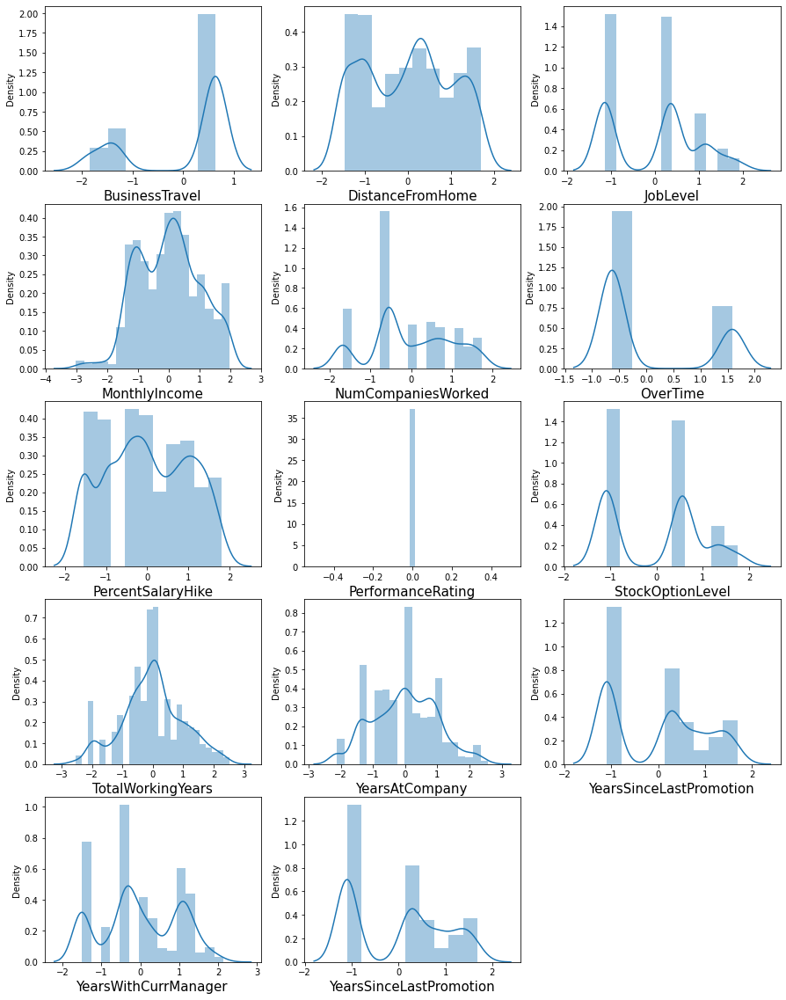

In [88]:
collist=[  'BusinessTravel', 'DistanceFromHome', 'JobLevel', 'MonthlyIncome', 'NumCompaniesWorked', 'OverTime', 'PercentSalaryHike', 'PerformanceRating', 'StockOptionLevel', 'TotalWorkingYears', 'YearsAtCompany', 'YearsSinceLastPromotion', 'YearsWithCurrManager', 'YearsSinceLastPromotion']

plt.figure(figsize=(15,20))
plotnumber = 1

for column in HR_Analytics[collist]:
    if plotnumber<=14:
        ax = plt.subplot(5,3,plotnumber)
        sns.distplot(HR_Analytics[column])
        plt.xlabel(column,fontsize=15)
    plotnumber+=1
plt.show()

The data is not normal but the skewness has got removed compared to the old data.

## Data preprocessing

### Spliting data into Target and Features:

In [66]:
x=HR_Analytics.drop("Attrition",axis=1)
y=HR_Analytics["Attrition"]

In [67]:
y.head()

0    1
1    0
2    1
3    0
4    0
Name: Attrition, dtype: int32

In [68]:
x.head()

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,0.638730,1102,2,-1.489968,2,1,1,2,0,...,0.0,1,-1.084263,-0.173231,0,1,0.231837,4,-1.073534,0.582177
1,49,-1.380776,279,1,0.244561,1,1,2,3,1,...,0.0,4,0.548653,0.147620,3,3,0.948319,7,0.193168,1.018073
2,37,0.638730,1373,1,-1.028366,2,4,4,4,1,...,0.0,2,-1.084263,-0.351153,3,3,-2.156089,0,-1.073534,-1.528426
3,33,-1.380776,1392,1,-0.698191,4,1,5,4,0,...,0.0,3,-1.084263,-0.173231,3,3,0.621429,7,1.027520,-1.528426
4,27,0.638730,591,1,-1.028366,1,3,7,1,1,...,0.0,4,0.548653,-0.544046,3,3,-0.933983,2,0.722874,-0.347871


In [69]:
y.shape, x.shape

((1387,), (1387, 31))

The data is balanced.

### StandardScaler

In [70]:
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns = x.columns)
x

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0.536681,0.638730,0.734325,1.405373,-1.489968,-0.876177,-0.940815,-1.702014,-0.665328,-1.229911,...,0.0,-1.575817,-1.084263,-0.173231,-2.171420,-2.501172,0.231837,0.040903,-1.073534,0.582177
1,1.442111,-1.380776,-1.307769,-0.496337,0.244561,-1.853858,-0.940815,-1.700354,0.251978,0.813067,...,0.0,1.199034,0.548653,0.147620,0.151871,0.336558,0.948319,0.965895,0.193168,1.018073
2,0.083966,0.638730,1.406752,-0.496337,-1.028366,-0.876177,1.305159,-1.697034,1.169285,0.813067,...,0.0,-0.650866,-1.084263,-0.351153,0.151871,0.336558,-2.156089,-1.192419,-1.073534,-1.528426
3,-0.368749,-1.380776,1.453896,-0.496337,-0.698191,1.079185,-0.940815,-1.695374,1.169285,-1.229911,...,0.0,0.274084,-1.084263,-0.173231,0.151871,0.336558,0.621429,0.965895,1.027520,-1.528426
4,-1.047821,0.638730,-0.533609,-0.496337,-1.028366,-1.853858,0.556501,-1.692054,-1.582635,0.813067,...,0.0,1.199034,0.548653,-0.544046,0.151871,0.336558,-0.933983,-0.575758,0.722874,-0.347871
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1382,-0.029213,-1.380776,0.193406,-0.496337,1.408969,-0.876177,0.556501,1.717604,0.251978,0.813067,...,0.0,0.274084,0.548653,1.039364,0.151871,0.336558,0.003289,-0.575758,-1.073534,0.018680
1383,0.310324,0.638730,-0.479021,-0.496337,-0.049519,-1.853858,0.556501,1.719264,1.169285,0.813067,...,0.0,-1.575817,0.548653,-0.007630,1.700732,0.336558,0.436162,0.965895,0.193168,1.018073
1384,-1.047821,0.638730,-1.615447,-0.496337,-0.440553,0.101504,-0.940815,1.722584,-0.665328,0.813067,...,0.0,-0.650866,0.548653,-0.544046,-2.171420,0.336558,0.231837,-0.575758,-1.073534,0.018680
1385,1.442111,-1.380776,0.538304,1.405373,-1.028366,0.101504,0.556501,1.724244,1.169285,0.813067,...,0.0,1.199034,-1.084263,1.039364,0.151871,-1.082307,0.791264,0.657565,-1.073534,1.205782


## Variance Threshold Method

It removes all features which variance doesn't meet some threshold. By default, it removes all zero-variance features.

In [71]:
var_threshold = VarianceThreshold(threshold=0)
var_threshold.fit(x)

VarianceThreshold(threshold=0)

In [72]:
var_threshold.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True, False,  True,  True,  True,  True,  True,
        True,  True,  True,  True])

In [73]:
x.columns[var_threshold.get_support()]

Index(['Age', 'BusinessTravel', 'DailyRate', 'Department', 'DistanceFromHome',
       'Education', 'EducationField', 'EmployeeNumber',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime',
       'PercentSalaryHike', 'RelationshipSatisfaction', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [74]:
x.shape

(1387, 31)

In [75]:
# taking  out  all the  constant  columns 
cons_columns = [column for column in x.columns
               if column not in x.columns[var_threshold.get_support()]]
print(len(cons_columns))

1


One feature "PercentSalaryHike" is not important. So, we will drop this column.

In [76]:
x.drop('PercentSalaryHike', axis =1, inplace=True)

In [77]:
x.columns

Index(['Age', 'BusinessTravel', 'DailyRate', 'Department', 'DistanceFromHome',
       'Education', 'EducationField', 'EmployeeNumber',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime',
       'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [78]:
x.shape

(1387, 30)

Now, We will use the SelectKBest method.

### SelectKBest method

In [79]:
best_fit = SelectKBest(score_func = f_classif, k =29)
fit = best_fit.fit(x,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(x.columns)

In [80]:
fit = best_fit.fit(x,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(x.columns)
dfcolumns.head()
featureScores = pd.concat([dfcolumns,dfscores],axis = 1)
featureScores.columns = ['Feature', 'Score']
print(featureScores.nlargest(29,'Score'))

                     Feature      Score
19                  OverTime  98.140453
23         TotalWorkingYears  71.035776
16             MonthlyIncome  62.177751
26            YearsAtCompany  58.889790
12                  JobLevel  55.604844
29      YearsWithCurrManager  50.087532
22          StockOptionLevel  43.797179
27        YearsInCurrentRole  41.726267
15             MaritalStatus  36.836958
0                        Age  36.092149
11            JobInvolvement  25.307350
14           JobSatisfaction  18.303387
8    EnvironmentSatisfaction  17.719366
4           DistanceFromHome   9.142284
13                   JobRole   5.747073
3                 Department   5.631654
25           WorkLifeBalance   5.429960
24     TrainingTimesLastYear   4.559904
2                  DailyRate   4.549637
21  RelationshipSatisfaction   3.805168
28   YearsSinceLastPromotion   3.609787
18        NumCompaniesWorked   3.133075
1             BusinessTravel   1.850432
9                     Gender   1.822547


Selecting the best features based on above scores, we can see that the column "HourlyRate" has most lowest features for the prediction, so we will drop this column.

In [81]:
x = x.drop([ "HourlyRate"],axis=1)

In [82]:
x.columns

Index(['Age', 'BusinessTravel', 'DailyRate', 'Department', 'DistanceFromHome',
       'Education', 'EducationField', 'EmployeeNumber',
       'EnvironmentSatisfaction', 'Gender', 'JobInvolvement', 'JobLevel',
       'JobRole', 'JobSatisfaction', 'MaritalStatus', 'MonthlyIncome',
       'MonthlyRate', 'NumCompaniesWorked', 'OverTime', 'PerformanceRating',
       'RelationshipSatisfaction', 'StockOptionLevel', 'TotalWorkingYears',
       'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany',
       'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

Now, we have completed features selection process through using 2 techniques.

## Checking for Multicolinearity

### VIF (Variance Inflation factor)

In [83]:
vif = pd.DataFrame()
vif['VIF values']= [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif['Features'] = x.columns
vif

,VIF values,Features
0,1.869450,Age
1,1.012876,BusinessTravel
2,1.025840,DailyRate
3,2.148998,Department
4,1.016449,DistanceFromHome
5,1.062127,Education
6,1.021808,EducationField
7,1.022306,EmployeeNumber
8,1.023404,EnvironmentSatisfaction
9,1.025233,Gender


The VIF value is less than 10 in all columns. But one column 'PerformanceRating' is having no relation with Target column. So we will drop that column.

In [84]:
x.drop('PerformanceRating', axis =1, inplace=True)

In [85]:
x.columns

Index(['Age', 'BusinessTravel', 'DailyRate', 'Department', 'DistanceFromHome',
       'Education', 'EducationField', 'EmployeeNumber',
       'EnvironmentSatisfaction', 'Gender', 'JobInvolvement', 'JobLevel',
       'JobRole', 'JobSatisfaction', 'MaritalStatus', 'MonthlyIncome',
       'MonthlyRate', 'NumCompaniesWorked', 'OverTime',
       'RelationshipSatisfaction', 'StockOptionLevel', 'TotalWorkingYears',
       'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany',
       'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

#### Checking again Multicolinearity using VIF

In [86]:
vif = pd.DataFrame()
vif['VIF values']= [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif['Features'] = x.columns
vif

,VIF values,Features
0,1.869450,Age
1,1.012876,BusinessTravel
2,1.025840,DailyRate
3,2.148998,Department
4,1.016449,DistanceFromHome
5,1.062127,Education
6,1.021808,EducationField
7,1.022306,EmployeeNumber
8,1.023404,EnvironmentSatisfaction
9,1.025233,Gender


__Every column is less than 10. So, we will create model now.__

## Creating Model

### Finding the best random state among all the models

In [87]:
maxAccu=0
maxRS=0
for i in range(1,100):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.30, random_state =i)
    LR = LogisticRegression()
    LR.fit(x_train, y_train)
    pred = LR.predict(x_test)
    acc=accuracy_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on Random_state ",maxRS)

Best accuracy is  0.9040767386091128  on Random_state  30


__At random state 6, we are getting best accuracy score i.e., 90%__

## Creating train-test-split

In [88]:
# creating new train test split using the random state.
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=maxRS)

In [89]:
x.shape, y.shape

((1387, 28), (1387,))

In [90]:
x_train.shape,y_train.shape, x_test.shape,y_test.shape

((970, 28), (970,), (417, 28), (417,))

We can see the x.shape value is divided into x_train.shape and x_test.shape and like this y.shape is also divided. As it is a categorical data , so we have to understand this by Classification problem

## Logistic Regression 

In [91]:
lr=LogisticRegression()
lr.fit(x_train,y_train)
pred_lr=lr.predict(x_test)

print("accuracy_score: ", accuracy_score(y_test, pred_lr))
print("confusion_matrix: \n", confusion_matrix(y_test, pred_lr))
print("classification_report: \n", classification_report(y_test,pred_lr))

accuracy_score:  0.9040767386091128
confusion_matrix: 
 [[355   8]
 [ 32  22]]
classification_report: 
               precision    recall  f1-score   support

           0       0.92      0.98      0.95       363
           1       0.73      0.41      0.52        54

    accuracy                           0.90       417
   macro avg       0.83      0.69      0.74       417
weighted avg       0.89      0.90      0.89       417



### Confusion Matrix for Logistic Regression

Text(0.5, 1.0, 'Logistic regressor prediction Confusion_matrix')

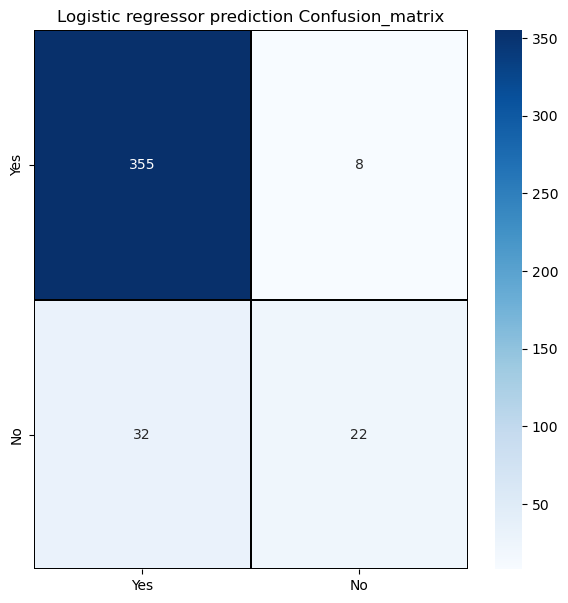

In [92]:
cm = confusion_matrix(y_test,pred_lr)
x_axis_labels = ["Yes","No"]
y_axis_labels = ["Yes","No"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Blues", 
xticklabels=x_axis_labels,
yticklabels=y_axis_labels)
plt.title("Logistic regressor prediction Confusion_matrix")

## Classification Algorithms

In [93]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier as KNN
from sklearn.ensemble import GradientBoostingClassifier

## Random Forest Classifier

In [94]:
rfc = RandomForestClassifier(n_estimators=200)
rfc.fit(x_train,y_train)
pred_rfc = rfc.predict(x_test)

print("accuracy_score: ",accuracy_score(y_test, pred_rfc))
print("confusion_matrix: \n",confusion_matrix(y_test, pred_rfc))
print("classification_report: \n",classification_report(y_test,pred_rfc))

accuracy_score:  0.8872901678657075
confusion_matrix: 
 [[360   3]
 [ 44  10]]
classification_report: 
               precision    recall  f1-score   support

           0       0.89      0.99      0.94       363
           1       0.77      0.19      0.30        54

    accuracy                           0.89       417
   macro avg       0.83      0.59      0.62       417
weighted avg       0.88      0.89      0.86       417



### Confusion Matrix for RFC

Text(0.5, 1.0, 'RFC prediction Confusion_matrix')

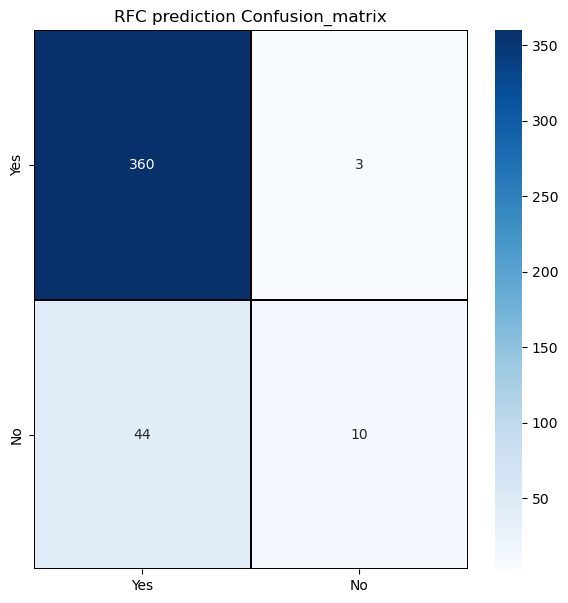

In [95]:
cm = confusion_matrix(y_test,pred_rfc)
x_axis_labels = ["Yes","No"]
y_axis_labels = ["Yes","No"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Blues", 
xticklabels=x_axis_labels,
yticklabels=y_axis_labels)
plt.title("RFC prediction Confusion_matrix")

## Decision Tree Classifier

In [96]:
dtc = DecisionTreeClassifier()
dtc.fit(x_train,y_train)
pred_dtc = dtc.predict(x_test)

print("accuracy_score: ",accuracy_score(y_test, pred_dtc))
print(confusion_matrix(y_test, pred_dtc))
print(classification_report(y_test,pred_dtc))

accuracy_score:  0.7985611510791367
[[310  53]
 [ 31  23]]
              precision    recall  f1-score   support

           0       0.91      0.85      0.88       363
           1       0.30      0.43      0.35        54

    accuracy                           0.80       417
   macro avg       0.61      0.64      0.62       417
weighted avg       0.83      0.80      0.81       417



### Confusion Matrix for DTC

Text(0.5, 1.0, 'DTC prediction Confusion_matrix')

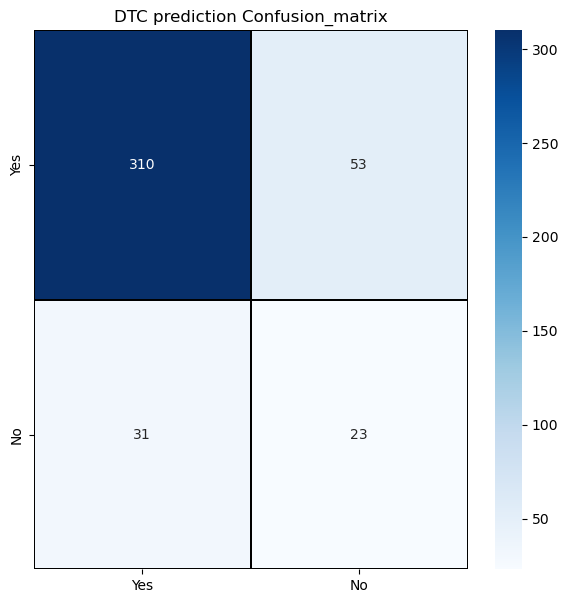

In [97]:
cm = confusion_matrix(y_test,pred_dtc)
x_axis_labels = ["Yes","No"]
y_axis_labels = ["Yes","No"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Blues", 
xticklabels=x_axis_labels,
yticklabels=y_axis_labels)
plt.title("DTC prediction Confusion_matrix")

## Support Vector Machine Classifier

In [98]:
svc = SVC(kernel='linear', gamma=3)
svc.fit(x_train,y_train)
pred_svc = svc.predict(x_test)

print("accuracy_score: ",accuracy_score(y_test, pred_svc))
print(confusion_matrix(y_test, pred_svc))
print(classification_report(y_test,pred_svc))

accuracy_score:  0.894484412470024
[[355   8]
 [ 36  18]]
              precision    recall  f1-score   support

           0       0.91      0.98      0.94       363
           1       0.69      0.33      0.45        54

    accuracy                           0.89       417
   macro avg       0.80      0.66      0.70       417
weighted avg       0.88      0.89      0.88       417



### Confusion Matrix for SVC

Text(0.5, 1.0, 'SVC prediction Confusion_matrix')

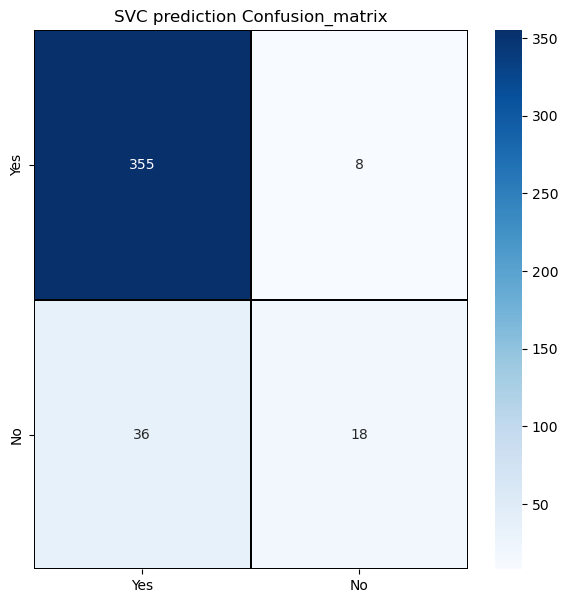

In [99]:
cm = confusion_matrix(y_test,pred_svc)
x_axis_labels = ["Yes","No"]
y_axis_labels = ["Yes","No"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Blues", 
xticklabels=x_axis_labels,
yticklabels=y_axis_labels)
plt.title("SVC prediction Confusion_matrix")

## KNN Classifier

In [100]:
knn = KNN()
knn.fit(x_train,y_train)
pred_knn = knn.predict(x_test)

print("accuracy_score: ",accuracy_score(y_test, pred_knn))
print(confusion_matrix(y_test, pred_knn))
print(classification_report(y_test,pred_knn))

accuracy_score:  0.8872901678657075
[[360   3]
 [ 44  10]]
              precision    recall  f1-score   support

           0       0.89      0.99      0.94       363
           1       0.77      0.19      0.30        54

    accuracy                           0.89       417
   macro avg       0.83      0.59      0.62       417
weighted avg       0.88      0.89      0.86       417



### Confusion Matrix for KNN classifier

Text(0.5, 1.0, 'KNN prediction Confusion_matrix')

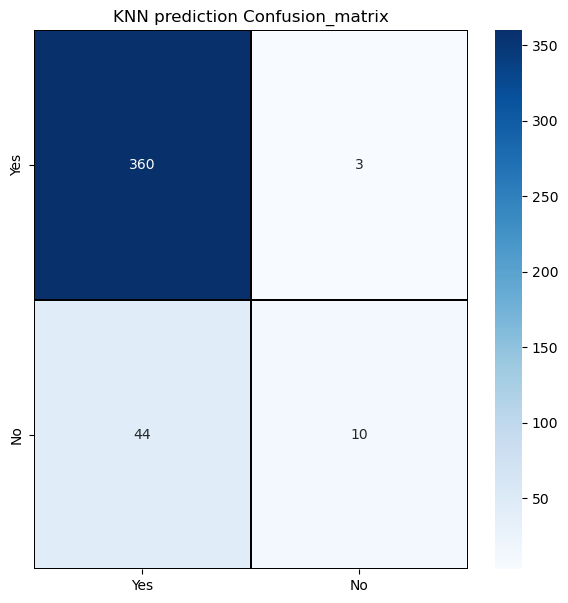

In [101]:
cm = confusion_matrix(y_test,pred_knn)
x_axis_labels = ["Yes","No"]
y_axis_labels = ["Yes","No"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Blues", 
xticklabels=x_axis_labels,
yticklabels=y_axis_labels)
plt.title("KNN prediction Confusion_matrix")

## Gradient Boosting Classifier

In [102]:
gb = GradientBoostingClassifier(n_estimators =300,learning_rate=0.1, max_depth=4)
gb.fit(x_train,y_train)
pred_gb = gb.predict(x_test)

print("accuracy_score: ",accuracy_score(y_test, pred_gb))
print(confusion_matrix(y_test, pred_gb))
print(classification_report(y_test,pred_gb))

accuracy_score:  0.8848920863309353
[[347  16]
 [ 32  22]]
              precision    recall  f1-score   support

           0       0.92      0.96      0.94       363
           1       0.58      0.41      0.48        54

    accuracy                           0.88       417
   macro avg       0.75      0.68      0.71       417
weighted avg       0.87      0.88      0.88       417



### Confusion Matrix for Gradient Boosting classifier

Text(0.5, 1.0, 'Gradient Boosting classifier prediction Confusion_matrix')

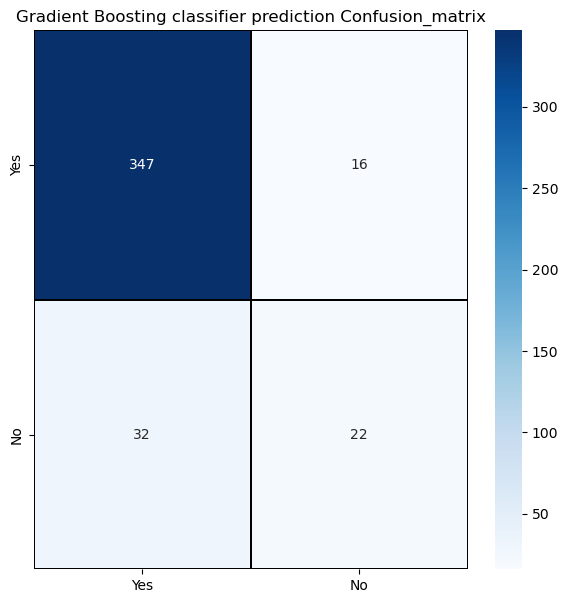

In [103]:
cm = confusion_matrix(y_test,pred_gb)
x_axis_labels = ["Yes","No"]
y_axis_labels = ["Yes","No"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Blues", 
xticklabels=x_axis_labels,
yticklabels=y_axis_labels)
plt.title("Gradient Boosting classifier prediction Confusion_matrix")

## Cross Validation Score for all the model

### CV Score for Logistic Regression

In [104]:
print('CV score for Logistic Regression: ',cross_val_score(lr,x,y,cv=9).mean())

CV score for Logistic Regression:  0.8774146999953452


### CV Score for Random Forest Classifier

In [116]:
print('CV score for Random forest Classifier: ',cross_val_score(rfc,x,y,cv=9).mean())

CV score for Random forest Classifier:  0.8514825676115999


### CV Score for Decision Tree Classifier

In [117]:
print('CV score for Decision Tree Classifier: ',cross_val_score(dtc,x,y,cv=9).mean())

CV score for Decision Tree Classifier:  0.7621002653260718


### CV Score for Support Vector Classifier

In [118]:
print('CV score for Support Vector  Classifier: ',cross_val_score(svc,x,y,cv=9).mean())

CV score for Support Vector  Classifier:  0.8658893078247917


### CV Score for KNN Classifier

In [119]:
print('CV score for KNN Classifier: ',cross_val_score(knn,x,y,cv=9).mean())

CV score for KNN Classifier:  0.850034911325234


### CV Score for Gradient Boosting Classifier

In [120]:
print('CV score for Gradient Boosting Classifier: ',cross_val_score(gb,x,y,cv=9).mean())

CV score for Gradient Boosting Classifier:  0.8658939626681561


#### From the observation of accuracy and cross validation score and their difference we can predict that Support Vector Machine Classifier is the best model.

## Support Vector Machine Classifier

In [121]:
svc=SVC(random_state=42)

In [122]:
param_grid = {'C':[1,10,100,1000],'gamma':[1,0.1,0.001,0.0001], 'kernel':['linear','rbf']}

In [123]:
CV_SVC = GridSearchCV(SVC(),param_grid,refit = True, verbose=2)

In [124]:
CV_SVC.fit(x_train,y_train)

Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ...........................C=1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END ...........................C=1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END ...........................C=1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END ...........................C=1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END ...........................C=1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END ......................C=1, gamma=0.1, kernel=linear; total time=   0.0s
[CV] END ......................C=1, gamma=0.1, 

[CV] END ..................C=100, gamma=0.001, kernel=linear; total time=   1.5s
[CV] END ..................C=100, gamma=0.001, kernel=linear; total time=   1.6s
[CV] END ..................C=100, gamma=0.001, kernel=linear; total time=   1.6s
[CV] END ..................C=100, gamma=0.001, kernel=linear; total time=   2.5s
[CV] END .....................C=100, gamma=0.001, kernel=rbf; total time=   0.0s
[CV] END .....................C=100, gamma=0.001, kernel=rbf; total time=   0.0s
[CV] END .....................C=100, gamma=0.001, kernel=rbf; total time=   0.0s
[CV] END .....................C=100, gamma=0.001, kernel=rbf; total time=   0.0s
[CV] END .....................C=100, gamma=0.001, kernel=rbf; total time=   0.0s
[CV] END .................C=100, gamma=0.0001, kernel=linear; total time=   4.1s
[CV] END .................C=100, gamma=0.0001, kernel=linear; total time=   1.5s
[CV] END .................C=100, gamma=0.0001, kernel=linear; total time=   1.6s
[CV] END .................C=

GridSearchCV(estimator=SVC(),
             param_grid={'C': [1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.001, 0.0001],
                         'kernel': ['linear', 'rbf']},
             verbose=2)

In [125]:
CV_SVC.best_params_

{'C': 100, 'gamma': 0.001, 'kernel': 'rbf'}

In [126]:
predic = CV_SVC.predict(x_test)

In [127]:
print(classification_report(y_test,predic))
print(confusion_matrix(y_test, predic))

              precision    recall  f1-score   support

           0       0.91      0.98      0.95       363
           1       0.74      0.37      0.49        54

    accuracy                           0.90       417
   macro avg       0.83      0.68      0.72       417
weighted avg       0.89      0.90      0.89       417

[[356   7]
 [ 34  20]]


In [128]:
acc=accuracy_score(y_test,predic)
print(acc*100)

90.16786570743405


Here the final model gives 90% accuracy after tuning.

## ROC-AUC Curve

In [129]:
fpr, tpr, threshold = roc_curve(y_test,pred)
auc = roc_auc_score(y_test,pred)

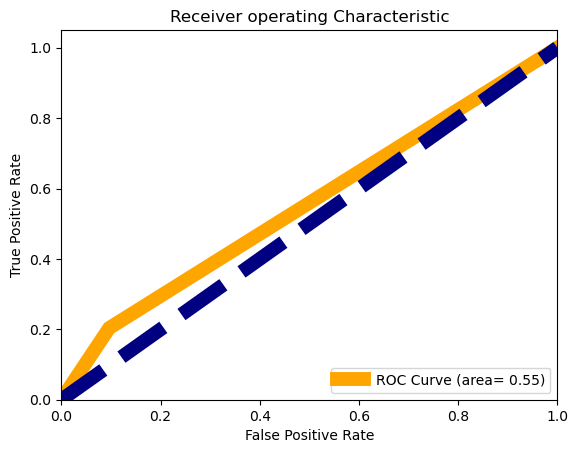

In [130]:
plt.figure()
plt.plot(fpr,tpr,color="orange",lw=10,label="ROC Curve (area= %0.2f)" % auc)
plt.plot([0,1],[0,1],color="navy",lw=10,linestyle="--")
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver operating Characteristic")
plt.legend(loc="lower right")
plt.show()

This is the AUC-ROC curve for the models which is plotted False positive rate against True positive rate. So the best model has the area under curve as 0.48.

### Checking predicted and original values

In [131]:
a =np.array(y_test)
predicted=np.array(CV_SVC.predict(x_test))
HR_Project=pd.DataFrame({'Orginal':a,'Predicted':predicted}, index=range(len(a)))
HR_Project

,Orginal,Predicted
0,0,0
1,0,0
2,1,1
3,0,0
4,0,0
...,...,...
412,0,0
413,1,0
414,0,0
415,0,0


As we can see, predicted and original values matches approx 100%.